In [2]:
library(repr)
options(repr.plot.width=18, repr.plot.height=9)

- 改进了重复采样的估计（即在纵向数据中）
- 当子样本之间存在不平衡时改进估计
- 子样本中变异的估计
- 通过保留子样本之间的变异以避免简单平均

# 蝌蚪分层数据

In [2]:
library(rethinking)
data(reedfrogs)
d <- reedfrogs
rm(reedfrogs)
detach(package:rethinking, unload = T)
library(brms)

library(tidyverse)

d %>%
  glimpse()

Loading required package: rstan

Loading required package: StanHeaders

Loading required package: ggplot2

rstan (Version 2.19.3, GitRev: 2e1f913d3ca3)

For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)

Loading required package: parallel

Loading required package: dagitty

rethinking (Version 1.95)


Attaching package: ‘rethinking’


The following object is masked from ‘package:stats’:

    rstudent


Loading required package: Rcpp

Loading 'brms' package (version 2.12.0). Useful instructions
can be found by typing help('brms'). A more detailed introduction
to the package is available through vignette('brms_overview').


Attaching package: ‘brms’


The following object is masked from ‘package:rstan’:

    loo


The following object is masked from ‘package:stats’:

    ar


─ Attaching packages ─────────────────

Observations: 48
Variables: 5
$ density  <int> 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,…
$ pred     <fct> no, no, no, no, no, no, no, no, pred, pred, pred, pred, pre…
$ size     <fct> big, big, big, big, small, small, small, small, big, big, b…
$ surv     <int> 9, 10, 7, 10, 9, 9, 10, 9, 4, 9, 7, 6, 7, 5, 9, 9, 24, 23, …
$ propsurv <dbl> 0.90, 1.00, 0.70, 1.00, 0.90, 0.90, 1.00, 0.90, 0.40, 0.90,…


- `density`：初始蝌蚪密度 (1.2 x 0.8 x 0.4 m 水池中蝌蚪数)
- `pred`：因子变量, 存在/不存在捕食者
- `size`：因子变量, 蝌蚪尺寸
- `surv`：生存数
- `propsurv`：生存比例 (=$\frac{surv}{density}$)

In [3]:
# 为每一个案例指定水池变量

d <- 
  d %>%
  mutate(tank = 1:nrow(d))
head(d)

,density,pred,size,surv,propsurv,tank
,<int>,<fct>,<fct>,<int>,<dbl>,<int>
1,10,no,big,9,0.9,1
2,10,no,big,10,1.0,2
3,10,no,big,7,0.7,3
4,10,no,big,10,1.0,4
5,10,no,small,9,0.9,5
6,10,no,small,9,0.9,6


## 建模
- **单层模型**
\begin{aligned} s_{i} & \sim \operatorname{Binomial}\left(n_{i}, p_{i}\right) \\ \operatorname{logit}\left(p_{i}\right) &=\alpha_{\mathrm{TANK}[i]} \\ \alpha_{\mathrm{TANK}} & \sim \operatorname{Normal}(0,5) \end{aligned}
可变截距模型，其中$n_i=density_i$，每个`tank`有各自的截距。估计结果有 48 个不同的截距估计分别对应不同的水槽。要得到每个水槽的生存率期望，只要对 a_tank 中的任何一个取值进行逆逻辑变换就可以了

- **多层模型**
\begin{aligned} s_{i} & \sim \operatorname{Binomial}\left(n_{i}, p_{i}\right) \\ \operatorname{logit}\left(p_{i}\right) &=\alpha_{\mathrm{TANK}[i]} \\ \alpha_{\mathrm{TANK}} & \sim \operatorname{Normal}(\alpha, \sigma) \\ \alpha & \sim \operatorname{Normal}(0,1) \\ \sigma & \sim \operatorname{HalfCauchy}(0,1) \end{aligned}
截距$α_{TANK}$的先验是两个参数α和σ的函数。这就是分层模型中“层”的由来。在最高层，结果变量是s，参数是$α_{TANK}$，相应的先验分布是 $α_{TANK}$ ~ Normal(α,σ);在第二个层级中，“结果”変量是一个截距参数向量$α_{TANK}$，相应的参数是α和σ，且它们各自的先验是`α ~ Normal(0,1)`和`σ ~ HalfCauchy (0,1)`。该模型拟合了 50 个参数：一个总体截距参数 α、水槽间标准差σ，以及其他 48 个水槽截距参数

In [4]:
b12.1 <- 
  brm(data = d, family = binomial,
      surv | trials(density) ~ 0 + factor(tank),
      prior(normal(0, 5), class = b),
      iter = 5000, warmup = 1000, chains = 4, cores = 4,
      seed = 12)

b12.2 <- 
  brm(data = d, family = binomial,
      surv | trials(density) ~ 1 + (1 | tank),
      prior = c(prior(normal(0, 1), class = Intercept),
                prior(cauchy(0, 1), class = sd)),
      iter = 5000, warmup = 1000, chains = 4, cores = 4,
      seed = 12)

b12.1 <- add_criterion(b12.1, "waic")
b12.2 <- add_criterion(b12.2, "waic")

w <- loo_compare(b12.1, b12.2, criterion = "waic")

print(w, simplify = F)
system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

Compiling the C++ model

Start sampling

Compiling the C++ model

Start sampling



      elpd_diff se_diff elpd_waic se_elpd_waic p_waic se_p_waic waic   se_waic
b12.2    0.0       0.0  -100.2       3.6         21.0    0.8     200.4    7.3 
b12.1   -0.4       2.2  -100.6       4.7         22.5    0.6     201.1    9.4 


In [16]:
print(b12.1)
cat("===================================================\n")
print(b12.2)

 Family: binomial 
  Links: mu = logit 
Formula: surv | trials(density) ~ 0 + factor(tank) 
   Data: d (Number of observations: 48) 
Samples: 4 chains, each with iter = 5000; warmup = 1000; thin = 1;
         total post-warmup samples = 16000

Population-Level Effects: 
             Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
factortank1      2.50      1.16     0.66     5.22 1.00    26616     9983
factortank2      5.74      2.78     1.75    12.34 1.00    21103    11139
factortank3      0.92      0.73    -0.43     2.45 1.00    36477    10626
factortank4      5.71      2.76     1.73    12.26 1.00    19240     9767
factortank5      2.52      1.16     0.64     5.22 1.00    26913     9788
factortank6      2.52      1.18     0.61     5.26 1.00    25861     9121
factortank7      5.71      2.75     1.74    12.25 1.00    20820    11072
factortank8      2.52      1.19     0.62     5.28 1.00    27002     9215
factortank9     -0.44      0.67    -1.80     0.83 1.00    36935    10894

In [11]:
cbind(waic_diff = w[, 1] * -2,
      se        = w[, 2] *  2)

,waic_diff,se
b12.2,0.0000000,0.000000
b12.1,0.7864694,4.462357


In [5]:
b12.1 <- add_criterion(b12.1, "loo")
b12.2 <- add_criterion(b12.2, "loo")

post <- posterior_samples(b12.2, add_chain = T)     # 获取后验样本

post_mdn <- 
  coef(b12.2, robust = T)$tank[, , ] %>%            # 计算每个水槽的截距中位数
  as_tibble() %>% 
  bind_cols(d) %>%
  mutate(post_mdn = inv_logit_scaled(Estimate))     # 并且将这个中位数变换到概率尺度上

head(post_mdn)

system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

Warning message:
“Found 46 observations with a pareto_k > 0.7 in model 'b12.1'. With this many problematic observations, it may be more appropriate to use 'kfold' with argument 'K = 10' to perform 10-fold cross-validation rather than LOO.”
Warning message:
“Found 44 observations with a pareto_k > 0.7 in model 'b12.2'. With this many problematic observations, it may be more appropriate to use 'kfold' with argument 'K = 10' to perform 10-fold cross-validation rather than LOO.”


Estimate,Est.Error,Q2.5,Q97.5,density,pred,size,surv,propsurv,tank,post_mdn
<dbl>,<dbl>,<dbl>,<dbl>,<int>,<fct>,<fct>,<int>,<dbl>,<int>,<dbl>
2.0691903,0.8626030,0.5763609,4.025398,10,no,big,9,0.9,1,0.8878724
2.9469105,1.0790717,1.1809953,5.433280,10,no,big,10,1.0,2,0.9501173
0.9670041,0.6594311,-0.2553491,2.369308,10,no,big,7,0.7,3,0.7245219
2.9490531,1.0747851,1.1912490,5.545031,10,no,big,10,1.0,4,0.9502187
2.0583723,0.8371154,0.5965975,4.037961,10,no,small,9,0.9,5,0.8867909
2.0646245,0.8522208,0.5977949,4.012566,10,no,small,9,0.9,6,0.8874170


## 比较后验中位数

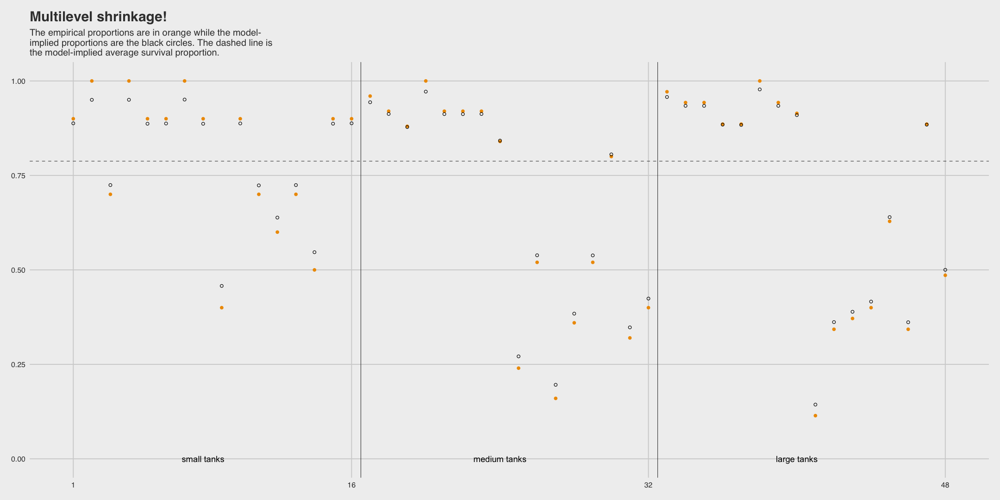

In [13]:
library(ggthemes) 
post_mdn %>%
  ggplot(aes(x = tank)) +
  geom_hline(yintercept = inv_logit_scaled(median(post$b_Intercept)), linetype = 2, size = 1/4) + # 绘制平均存活中位数
  geom_vline(xintercept = c(16.5, 32.5), size = 1/4) +
  geom_point(aes(y = propsurv), color = "orange2") +            # 展示每个水槽的原始存活率
  geom_point(aes(y = post_mdn), shape = 1) +                    # 加上后验中位数
  scale_y_continuous(limits = c(0, 1)) +
  scale_x_continuous(breaks = c(1, 16, 32, 48)) +
  labs(title    = "Multilevel shrinkage!",
       subtitle = "The empirical proportions are in orange while the model-\nimplied proportions are the black circles. The dashed line is\nthe model-implied average survival proportion.") +
  annotate("text", x = c(8, 16 + 8, 32 + 8), y = 0, 
           label = c("small tanks", "medium tanks", "large tanks")) +
  theme_fivethirtyeight() +
  theme(panel.grid = element_blank())

每个水槽中蝌蚪生存率的经验值，如实心点所示；同时还标明了 48 个分层模型给出的中位数估计(可变截距)，由空心圆表示。虚线标明了所有水槽中位生存率。垂直线将初始密度不同的水槽分开：小水槽（10 只蝌蚪）、中型水槽（25 只蝌蚪）、大水槽（35 只蝌蚪）。每个水槽对应的分层模型的后验分布中位数更接近虚线而非经验比例（也就是实际观测到的存活率）。这表明将所有水槽的信息汇总起来能够帮助每个水槽的推断

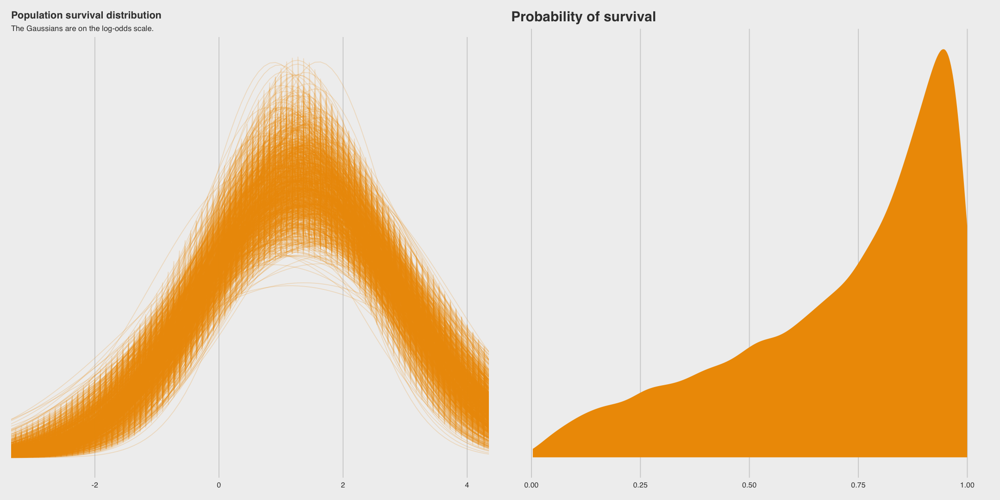

In [20]:
# this makes the output of `sample_n()` reproducible
set.seed(12)


p1 = sample_n(post, 1e3) %>%                                                    # 取前1000个后验分布
  expand(nesting(iter, b_Intercept, sd_tank__Intercept),
         x = seq(from = -4, to = 5, length.out = 100)) %>% 

  ggplot(aes(x = x, group = iter)) +                                            
  geom_line(aes(y = dnorm(x, b_Intercept, sd_tank__Intercept)),
            alpha = .2, color = "orange2") +
  labs(title = "Population survival distribution",
       subtitle = "The Gaussians are on the log-odds scale.") +
  scale_y_continuous(NULL, breaks = NULL) +
  coord_cartesian(xlim = c(-3, 4)) + 
  theme_fivethirtyeight() +
  theme(plot.title    = element_text(size = 13),
        plot.subtitle = element_text(size = 10))

p2 = ggplot(data = post, 
       aes(x = rnorm(n    = nrow(post),                                        # 从后验分布中抽取 16000 个水槽存活率样本
                     mean = b_Intercept, 
                     sd   = sd_tank__Intercept) %>% 
             inv_logit_scaled())) +                                            # 将上面的样本转化到概率的尺度并进行可视化
  geom_density(size = 0, fill = "orange2") +
  scale_y_continuous(NULL, breaks = NULL) +
  ggtitle("Probability of survival") +
  theme_fivethirtyeight()

cowplot::plot_grid(p1, p2, ncol = 2)
system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

首先，我们从正态分布中随机抽取一个值，该值的平均值为`b_Intercept`中的第一行，标准差为`sd_tank_ intercept`中的第一行，并将其传递给`inv_logit_scaled()`函数。通过用`nrow(post)`替换1，我们执行`nrow(post)`次(12000)。橙色对应的分布密度，就是这个过程的总结。

In [21]:
set.seed(12)

rnorm(n    = 1, 
      mean = post$b_Intercept, 
      sd   = post$sd_tank__Intercept) %>% 
  inv_logit_scaled()

[1] 0.2948128

### 使用指数分布代替半柯西先验

In [6]:
b12.2.e <- 
  update(b12.2,
         prior = c(prior(normal(0, 1), class = Intercept),
                   prior(exponential(1), class = sd)))
print(b12.2.e)

The desired updates require recompiling the model

Compiling the C++ model

Start sampling




SAMPLING FOR MODEL 'e6ff7cdf1e90c92956f9397a88cada6b' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 4.7e-05 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.47 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 5000 [  0%]  (Warmup)
Chain 1: Iteration:  500 / 5000 [ 10%]  (Warmup)
Chain 1: Iteration: 1000 / 5000 [ 20%]  (Warmup)
Chain 1: Iteration: 1001 / 5000 [ 20%]  (Sampling)
Chain 1: Iteration: 1500 / 5000 [ 30%]  (Sampling)
Chain 1: Iteration: 2000 / 5000 [ 40%]  (Sampling)
Chain 1: Iteration: 2500 / 5000 [ 50%]  (Sampling)
Chain 1: Iteration: 3000 / 5000 [ 60%]  (Sampling)
Chain 1: Iteration: 3500 / 5000 [ 70%]  (Sampling)
Chain 1: Iteration: 4000 / 5000 [ 80%]  (Sampling)
Chain 1: Iteration: 4500 / 5000 [ 90%]  (Sampling)
Chain 1: Iteration: 5000 / 5000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.409949 seconds (Warm-up)
Chain 1:                1.42995 seconds (Sampl

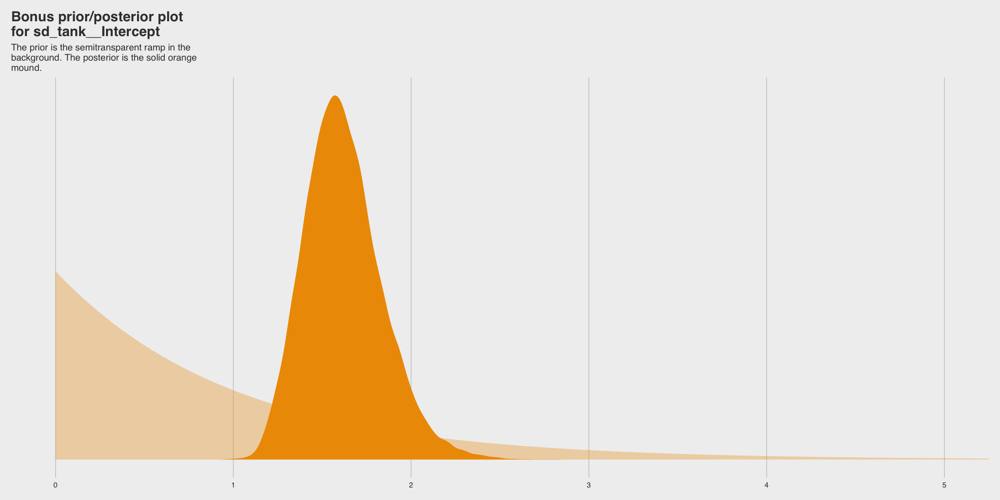

In [7]:
tibble(x = seq(from = 0, to = 6, by = .01)) %>% 
  
  ggplot() +
  # the prior
  geom_ribbon(aes(x = x, ymin = 0, ymax = dexp(x, rate = 1)),
              fill = "orange2", alpha = 1/3) +
  # the posterior
  geom_density(data = posterior_samples(b12.2.e),
               aes(x = sd_tank__Intercept), 
               fill = "orange2", size = 0) +
  scale_y_continuous(NULL, breaks = NULL) +
  coord_cartesian(xlim = c(0, 5)) +
  labs(title    = "Bonus prior/posterior plot\nfor sd_tank__Intercept",
       subtitle = "The prior is the semitransparent ramp in the\nbackground. The posterior is the solid orange\nmound.") +
  theme_fivethirtyeight()

# 变化效应与过拟合/欠拟合

## 建模
\begin{aligned} s_{i} & \sim \operatorname{Binomial}\left(n_{i}, p_{i}\right) \\ \operatorname{logit}\left(p_{i}\right) &=\alpha_{\mathrm{POND}[i]} \\ \alpha_{\mathrm{POND}} & \sim \operatorname{Normal}(\alpha, \sigma) \\ \alpha & \sim \operatorname{Normal}(0,1) \\ \sigma & \sim \operatorname{HalfCauchy}(0,1) \end{aligned}
- α，所有水潭存活率对数似然比的均值；
- σ，水潭存活率对数似然比的标准差；
- $α_{POND}$，每个水潭截距组成的向量，每个元素对应其中一个水潭

In [3]:
a       <-  1.4
sigma   <-  1.5
n_ponds <- 60       # 60 个水潭

set.seed(12)
(
  dsim <- 
  tibble(pond   = 1:n_ponds,
         ni     = rep(c(5, 10, 25, 35), each = n_ponds / 4) %>% as.integer(),   # 蝌蚪密度为 5、10、25 和 35 的水潭各有 15
         true_a = rnorm(n = n_ponds, mean = a, sd = sigma))         # 每个水潭真实的生存率对数似然比
  )

pond,ni,true_a
<int>,<int>,<dbl>
1,5,-0.82085139
2,5,3.76575421
3,5,-0.03511672
4,5,0.01999213
5,5,-1.59646315
6,5,0.99155593
7,5,0.92697693
8,5,0.45761715
9,5,1.24030417


## 模拟存活概率
基于二项分布对生存过程模拟，设每只蝌蚪的存活率为$p_i$：
$$p_{i}=\frac{\exp \left(\alpha_{i}\right)}{1+\exp \left(\alpha_{i}\right)}$$

In [4]:
set.seed(12)
(
  dsim <-
  dsim %>%
  mutate(si = rbinom(n = n(), prob = inv_logit_scaled(true_a), size = ni))
  )

pond,ni,true_a,si
<int>,<int>,<dbl>,<int>
1,5,-0.82085139,0
2,5,3.76575421,5
3,5,-0.03511672,4
4,5,0.01999213,3
5,5,-1.59646315,0
6,5,0.99155593,5
7,5,0.92697693,5
8,5,0.45761715,3
9,5,1.24030417,5


## 非聚合样本估计

In [5]:
(
  dsim <-
  dsim %>%
  mutate(p_nopool = si / ni)         # 计算每个水潭的存活率
  )

pond,ni,true_a,si,p_nopool
<int>,<int>,<dbl>,<int>,<dbl>
1,5,-0.82085139,0,0.0000000
2,5,3.76575421,5,1.0000000
3,5,-0.03511672,4,0.8000000
4,5,0.01999213,3,0.6000000
5,5,-1.59646315,0,0.0000000
6,5,0.99155593,5,1.0000000
7,5,0.92697693,5,1.0000000
8,5,0.45761715,3,0.6000000
9,5,1.24030417,5,1.0000000


## 部分聚合估计

In [6]:
b12.3 <- 
  brm(data = dsim, family = binomial,
      si | trials(ni) ~ 1 + (1 | pond),                       # 拟合基本可变截距模型
      prior = c(prior(normal(0, 1), class = Intercept),
                prior(cauchy(0, 1), class = sd)),
      iter = 20000, warmup = 5000, chains = 4, cores = 4,
      seed = 12)

print(b12.3)

system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

Compiling the C++ model

Start sampling



 Family: binomial 
  Links: mu = logit 
Formula: si | trials(ni) ~ 1 + (1 | pond) 
   Data: dsim (Number of observations: 60) 
Samples: 4 chains, each with iter = 20000; warmup = 5000; thin = 1;
         total post-warmup samples = 60000

Group-Level Effects: 
~pond (Number of levels: 60) 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sd(Intercept)     1.30      0.19     0.98     1.71 1.00    21322    33938

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     1.28      0.20     0.90     1.67 1.00    20518    30836

Samples were drawn using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).


`coef()`不返回`Eff.Sample`或`Rhat`列

In [10]:
coef(b12.3)$pond[c(1:2, 59:60), , ] %>% 
  round(digits = 2)

,Estimate,Est.Error,Q2.5,Q97.5
1,-1.08,0.88,-2.96,0.52
2,2.30,1.01,0.52,4.46
59,0.97,0.37,0.27,1.72
60,1.42,0.41,0.67,2.26


In [14]:
print(rhat(b12.3))

         b_Intercept   sd_pond__Intercept  r_pond[1,Intercept] 
           1.0002153            1.0001307            1.0000664 
 r_pond[2,Intercept]  r_pond[3,Intercept]  r_pond[4,Intercept] 
           1.0000038            0.9999772            0.9999462 
 r_pond[5,Intercept]  r_pond[6,Intercept]  r_pond[7,Intercept] 
           0.9999921            0.9999794            0.9999863 
 r_pond[8,Intercept]  r_pond[9,Intercept] r_pond[10,Intercept] 
           0.9999708            0.9999878            1.0000320 
r_pond[11,Intercept] r_pond[12,Intercept] r_pond[13,Intercept] 
           0.9999774            0.9999492            0.9999825 
r_pond[14,Intercept] r_pond[15,Intercept] r_pond[16,Intercept] 
           0.9999513            0.9999755            0.9999627 
r_pond[17,Intercept] r_pond[18,Intercept] r_pond[19,Intercept] 
           0.9999710            0.9999463            0.9999521 
r_pond[20,Intercept] r_pond[21,Intercept] r_pond[22,Intercept] 
           0.9999669            0.999974

In [13]:
print(neff_ratio(b12.3))

         b_Intercept   sd_pond__Intercept  r_pond[1,Intercept] 
           0.3420660            0.3535797            1.3542266 
 r_pond[2,Intercept]  r_pond[3,Intercept]  r_pond[4,Intercept] 
           1.6186340            1.7777520            1.8570578 
 r_pond[5,Intercept]  r_pond[6,Intercept]  r_pond[7,Intercept] 
           1.3298712            1.5341824            1.5692430 
 r_pond[8,Intercept]  r_pond[9,Intercept] r_pond[10,Intercept] 
           1.7745073            1.6991123            1.5883042 
r_pond[11,Intercept] r_pond[12,Intercept] r_pond[13,Intercept] 
           1.8795716            1.7760306            1.8972469 
r_pond[14,Intercept] r_pond[15,Intercept] r_pond[16,Intercept] 
           1.8577811            1.7995595            1.5083290 
r_pond[17,Intercept] r_pond[18,Intercept] r_pond[19,Intercept] 
           1.4640750            1.6443513            1.5991178 
r_pond[20,Intercept] r_pond[21,Intercept] r_pond[22,Intercept] 
           1.6162421            1.688858

`neff_ratio()`函数返回有效样本占`post-warmup`迭代总数的比率，即$\frac{eff}{total\_post-warmup\_iter}$。如果我们知道`neff_ratio()`的值和`post-warmup`迭代总数，则`Eff.Sample`的值可通过代数方法求得。一个快速的解决方案是查看print()输出的`total post-warmup samples`。另一种方法是从`fit`对象中提取信息。

In [15]:
(n_iter <- (b12.3$fit@sim$iter - b12.3$fit@sim$warmup) * b12.3$fit@sim$chains)   #获取有效样本数

[1] 60000

In [16]:
neff_ratio(b12.3) %>% 
  data.frame() %>% 
  rownames_to_column() %>% 
  set_names("parameter", "neff_ratio") %>% 
  mutate(eff_sample = (neff_ratio * n_iter) %>% round(digits = 0)) %>% 
  head()

,parameter,neff_ratio,eff_sample
,<chr>,<dbl>,<dbl>
1,b_Intercept,0.3420660,20524
2,sd_pond__Intercept,0.3535797,21215
3,"r_pond[1,Intercept]",1.3542266,81254
4,"r_pond[2,Intercept]",1.6186340,97118
5,"r_pond[3,Intercept]",1.7777520,106665
6,"r_pond[4,Intercept]",1.8570578,111423


In [17]:
dsim %>% 
  glimpse()

Observations: 60
Variables: 5
$ pond     <int> 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, …
$ ni       <int> 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 10, 10, 10, 10…
$ true_a   <dbl> -0.82085139, 3.76575421, -0.03511672, 0.01999213, -1.596463…
$ si       <int> 0, 5, 4, 3, 0, 5, 5, 3, 5, 5, 3, 3, 3, 4, 4, 6, 10, 9, 9, 9…
$ p_nopool <dbl> 0.0, 1.0, 0.8, 0.6, 0.0, 1.0, 1.0, 0.6, 1.0, 1.0, 0.6, 0.6,…


In [18]:
# we could have included this step in the block of code below, if we wanted to
p_partpool <-                                               # 定义部分聚合结果对应的逆变化概率
  coef(b12.3)$pond[, , ] %>% 
  as_tibble() %>%
  transmute(p_partpool = inv_logit_scaled(Estimate))

dsim <- 
  dsim %>%
  bind_cols(p_partpool) %>% 
  mutate(p_true         = inv_logit_scaled(true_a)) %>%
  mutate(nopool_error   = abs(p_nopool   - p_true),         # 获取预测离差
         partpool_error = abs(p_partpool - p_true))         # 获取预测离差   

dsim %>% 
  glimpse()

Observations: 60
Variables: 9
$ pond           <int> 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16…
$ ni             <int> 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 10, 10, …
$ true_a         <dbl> -0.82085139, 3.76575421, -0.03511672, 0.01999213, -1.…
$ si             <int> 0, 5, 4, 3, 0, 5, 5, 3, 5, 5, 3, 3, 3, 4, 4, 6, 10, 9…
$ p_nopool       <dbl> 0.0, 1.0, 0.8, 0.6, 0.0, 1.0, 1.0, 0.6, 1.0, 1.0, 0.6…
$ p_partpool     <dbl> 0.2542513, 0.9088333, 0.8100953, 0.6828473, 0.2555472…
$ p_true         <dbl> 0.3055830, 0.9773737, 0.4912217, 0.5049979, 0.1684765…
$ nopool_error   <dbl> 0.305582963, 0.022626343, 0.308778278, 0.095002134, 0…
$ partpool_error <dbl> 0.051331649, 0.068540355, 0.318873542, 0.177849417, 0…


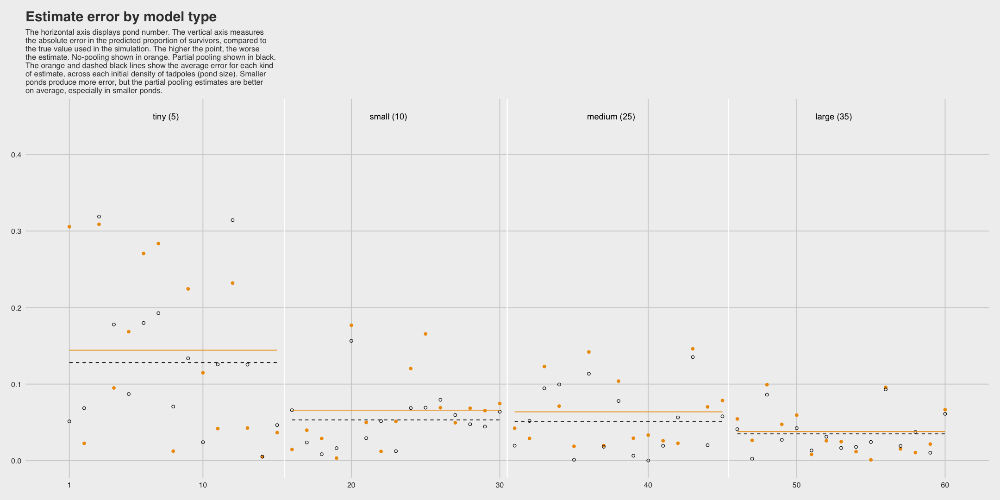

In [22]:
dfline <- 
  dsim %>%
  select(ni, nopool_error:partpool_error) %>%
  gather(key, value, -ni) %>%
  group_by(key, ni) %>%
  summarise(mean_error = mean(value)) %>%
  mutate(x    = c( 1, 16, 31, 46),
         xend = c(15, 30, 45, 60))
  
dsim %>% 
  ggplot(aes(x = pond)) +
  geom_vline(xintercept = c(15.5, 30.5, 45.4), 
             color = "white", size = 2/3) +
  geom_point(aes(y = nopool_error), color = "orange2") +
  geom_point(aes(y = partpool_error), shape = 1) +
  geom_segment(data = dfline, 
               aes(x = x, xend = xend, 
                   y = mean_error, yend = mean_error),
               color = rep(c("orange2", "black"), each = 4),
               linetype = rep(1:2, each = 4)) +
  scale_x_continuous(breaks = c(1, 10, 20, 30, 40, 50, 60)) +
  annotate("text", x = c(15 - 7.5, 30 - 7.5, 45 - 7.5, 60 - 7.5), y = .45, 
           label = c("tiny (5)", "small (10)", "medium (25)", "large (35)")) +
  labs(y        = "absolute error",
       title    = "Estimate error by model type",
       subtitle = "The horizontal axis displays pond number. The vertical axis measures\nthe absolute error in the predicted proportion of survivors, compared to\nthe true value used in the simulation. The higher the point, the worse\nthe estimate. No-pooling shown in orange. Partial pooling shown in black.\nThe orange and dashed black lines show the average error for each kind\nof estimate, across each initial density of tadpoles (pond size). Smaller\nponds produce more error, but the partial pooling estimates are better\non average, especially in smaller ponds.") +
  theme_fivethirtyeight() +
  theme(panel.grid    = element_blank(),
        plot.subtitle = element_text(size = 10))

In [23]:
dsim %>%
  select(ni, nopool_error:partpool_error) %>%
  gather(key, value, -ni) %>%
  group_by(key) %>%
  summarise(mean_error   = mean(value) %>% round(digits = 3),
            median_error = median(value) %>% round(digits = 3))

key,mean_error,median_error
<chr>,<dbl>,<dbl>
nopool_error,0.078,0.050
partpool_error,0.067,0.051


In [24]:
a       <-  1.4
sigma   <-  1.5
n_ponds <- 60

set.seed(1999)  # for new data, set a new seed
new_dsim <- 
  tibble(pond   = 1:n_ponds,
         ni     = rep(c(5, 10, 25, 35), each = n_ponds / 4) %>% as.integer(),
         true_a = rnorm(n = n_ponds, mean = a, sd = sigma)) %>% 
    mutate(si       = rbinom(n = n(), prob = inv_logit_scaled(true_a), size = ni)) %>% 
    mutate(p_nopool = si / ni)

glimpse(new_dsim)

Observations: 60
Variables: 5
$ pond     <int> 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, …
$ ni       <int> 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 10, 10, 10, 10…
$ true_a   <dbl> 2.4990087, 1.3432554, 3.2045137, 3.6047030, 1.6005354, 2.17…
$ si       <int> 4, 4, 5, 4, 4, 4, 2, 4, 3, 5, 4, 5, 2, 2, 5, 10, 7, 10, 10,…
$ p_nopool <dbl> 0.8, 0.8, 1.0, 0.8, 0.8, 0.8, 0.4, 0.8, 0.6, 1.0, 0.8, 1.0,…


In [25]:
b12.3_new <- 
  update(b12.3,
         newdata = new_dsim,
         iter = 20000, warmup = 5000, chains = 4, cores = 4)

print(b12.3_new)

system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

Start sampling



 Family: binomial 
  Links: mu = logit 
Formula: si | trials(ni) ~ 1 + (1 | pond) 
   Data: new_dsim (Number of observations: 60) 
Samples: 4 chains, each with iter = 20000; warmup = 5000; thin = 1;
         total post-warmup samples = 60000

Group-Level Effects: 
~pond (Number of levels: 60) 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sd(Intercept)     1.26      0.18     0.95     1.66 1.00    22723    33558

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     1.52      0.20     1.15     1.92 1.00    25764    37040

Samples were drawn using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).


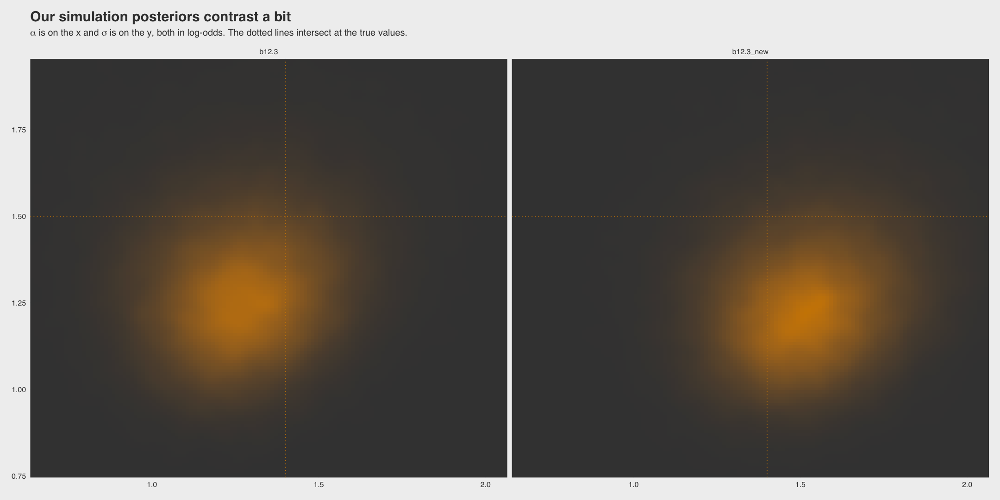

In [26]:
bind_rows(posterior_samples(b12.3),
          posterior_samples(b12.3_new)) %>%
  mutate(model = rep(c("b12.3", "b12.3_new"), each = n() / 2)) %>% 

  ggplot(aes(x = b_Intercept, y = sd_pond__Intercept)) +
  stat_density_2d(geom = "raster", 
                  aes(fill = stat(density)), 
                  contour = F, n = 200) +
  geom_vline(xintercept = a,     color = "orange3", linetype = 3) +
  geom_hline(yintercept = sigma, color = "orange3", linetype = 3) +
  scale_fill_gradient(low = "grey25", high = "orange3") +
  ggtitle("Our simulation posteriors contrast a bit",
          subtitle = expression(paste(alpha, " is on the x and ", sigma, " is on the y, both in log-odds. The dotted lines intersect at the true values."))) +
  coord_cartesian(xlim = c(.7, 2),
                  ylim = c(.8, 1.9)) +
  theme_fivethirtyeight() +
  theme(legend.position = "none",
        panel.grid      = element_blank()) +
  facet_wrap(~model, ncol = 2)

In [27]:
b12.3$fit@ stanmodel

S4 class stanmodel '539fb9cd42fc10350850bbd19a1a802f' coded as follows:
// generated with brms 2.12.0
functions {
}
data {
  int<lower=1> N;  // number of observations
  int Y[N];  // response variable
  int trials[N];  // number of trials
  // data for group-level effects of ID 1
  int<lower=1> N_1;  // number of grouping levels
  int<lower=1> M_1;  // number of coefficients per level
  int<lower=1> J_1[N];  // grouping indicator per observation
  // group-level predictor values
  vector[N] Z_1_1;
  int prior_only;  // should the likelihood be ignored?
}
transformed data {
}
parameters {
  real Intercept;  // temporary intercept for centered predictors
  vector<lower=0>[M_1] sd_1;  // group-level standard deviations
  vector[N_1] z_1[M_1];  // standardized group-level effects
}
transformed parameters {
  vector[N_1] r_1_1;  // actual group-level effects
  r_1_1 = (sd_1[1] * (z_1[1]));
}
model {
  // initialize linear predictor term
  vector[N] mu = Intercept + rep_vector(0, N);
  for 

In [30]:
b12.3$data %>% 
  head()

b12.3_new$data %>% 
  head()

,si,ni,pond
,<int>,<int>,<int>
1,0,5,1
2,5,5,2
3,4,5,3
4,3,5,4
5,0,5,5
6,5,5,6


,si,ni,pond
,<int>,<int>,<int>
1,4,5,1
2,4,5,2
3,5,5,3
4,4,5,4
5,4,5,5
6,4,5,6


# 多类模型

## 大猩猩数据多层模型
\begin{aligned} \operatorname{left}_{\text {-pull }} & \sim \text { Binomial }\left(n_{i}=1, p_{i}\right) \\ \operatorname{logit}\left(p_{i}\right) &=\alpha+\alpha_{\text {actor }_{i}}+\left(\beta_{1}+\beta_{2} \text { condition }_{i}\right) \text { prosoc_left }_{i} \\ \alpha_{\text {actor }} & \sim \operatorname{Normal}\left(0, \sigma_{\text {actor }}\right) \\ \alpha & \sim \operatorname{Normal}(0,10) \\ \beta_{1} & \sim \operatorname{Normal}(0,10) \\ \beta_{2} & \sim \operatorname{Normal}(0,10) \\ \sigma_{\text {actor }} & \sim \text { HalfCauchy }(0,1) \end{aligned}

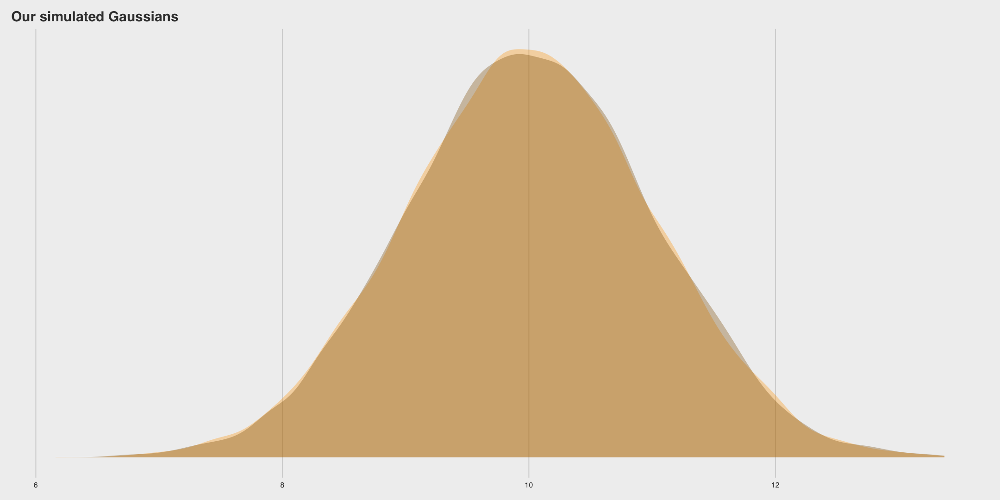

In [32]:
set.seed(12)
two_gaussians <- 
  tibble(y1 =      rnorm(n = 1e4, mean = 10, sd = 1),
         y2 = 10 + rnorm(n = 1e4, mean = 0,  sd = 1))

two_gaussians %>%
  
  ggplot() +
  geom_density(aes(x = y1), 
               size = 0, fill = "orange1", alpha = 1/3) +
  geom_density(aes(x = y2), 
               size = 0, fill = "orange4", alpha = 1/3) +
  scale_y_continuous(NULL, breaks = NULL) +
  labs(title = "Our simulated Gaussians") +
  theme_fivethirtyeight()

In [1]:
library(rethinking)
data(chimpanzees)
d <- chimpanzees
rm(chimpanzees)
detach(package:rethinking, unload = T)
library(brms)
head(d)

Loading required package: rstan

Loading required package: StanHeaders

Loading required package: ggplot2

rstan (Version 2.19.3, GitRev: 2e1f913d3ca3)

For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)

Loading required package: parallel

Loading required package: dagitty

rethinking (Version 1.95)


Attaching package: ‘rethinking’


The following object is masked from ‘package:stats’:

    rstudent


Loading required package: Rcpp

Loading 'brms' package (version 2.12.0). Useful instructions
can be found by typing help('brms'). A more detailed introduction
to the package is available through vignette('brms_overview').


Attaching package: ‘brms’


The following object is masked from ‘package:rstan’:

    loo


The following object is masked from ‘package:stats’:

    ar




,actor,recipient,condition,block,trial,prosoc_left,chose_prosoc,pulled_left
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,1,NA,0,1,2,0,1,0
2,1,NA,0,1,4,0,0,1
3,1,NA,0,1,6,1,0,0
4,1,NA,0,1,8,0,1,0
5,1,NA,0,1,10,1,1,1
6,1,NA,0,1,12,1,1,1


对于本例中仅针对`actor`而非`block`的可变截距，使用`pulled_left ~ 1 + ... + (1 | actor) `，而非`(1 | block)`。最初的解存在一些发散的现象，通过将`adapt_delta`设置为0.95解决。还可以使用更强的正则化先验(如设置截距和斜率参数为normal(0,2))来解决这个问题

In [2]:
b12.4 <- 
  brm(data = d, family = binomial,
      pulled_left | trials(1) ~ 1 + prosoc_left + prosoc_left:condition + (1 | actor),
      prior = c(prior(normal(0, 10), class = Intercept),
                prior(normal(0, 10), class = b),
                prior(cauchy(0, 1), class = sd)),
      # I'm using 4 cores, instead of the `cores=3` in McElreath's code
      iter = 10000, warmup = 2000, chains = 4, cores = 4,  
      control = list(adapt_delta = 0.95),
      seed = 12)

post <- posterior_samples(b12.4)

post %>%
  select(starts_with("r_actor")) %>% 
  gather() %>%
  # this is how we might add the grand mean to the actor-level deviations
  mutate(value = value + post$b_Intercept) %>% 
  group_by(key) %>%
  summarise(mean = mean(value) %>% round(digits = 2))

system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

Only 2 levels detected so that family 'bernoulli' might be a more efficient choice.

Compiling the C++ model

Start sampling



ERROR: Error in post %>% select(starts_with("r_actor")) %>% gather() %>% mutate(value = value + : 没有"%>%"这个函数


添加`actor`水平偏差以修正截距，即总体均值

In [38]:
coef(b12.4)$actor[, c(1, 3:4), 1] %>%
  as_tibble() %>% 
  round(digits = 2) %>%
  # here we put the credible intervals in an APA-6-style format
  mutate(`95% CIs` = str_c("[", Q2.5, ", ", Q97.5, "]"),
         actor     = str_c("chimp #", 1:7)) %>%
  rename(mean = Estimate) %>%
  select(actor, mean, `95% CIs`) %>% 
  knitr::kable()



|actor    |  mean|95% CIs        |
|:--------|-----:|:--------------|
|chimp #1 | -0.71|[-1.24, -0.2]  |
|chimp #2 |  4.60|[2.56, 8.53]   |
|chimp #3 | -1.02|[-1.58, -0.49] |
|chimp #4 | -1.02|[-1.58, -0.48] |
|chimp #5 | -0.71|[-1.24, -0.19] |
|chimp #6 |  0.23|[-0.29, 0.75]  |
|chimp #7 |  1.76|[1.06, 2.56]   |

## 两层模型
每个聚类变量都对应自己的标准差参数，这两个参数的作用就是调整每种聚类标准`actor`或`block`下不同类别之间的差别。这两个参数分别是$α_{ACTOR}$和$α_{BLOCK}$

\begin{aligned} \text { left_pull }_{i} & \sim \operatorname{Binomial}\left(n_{i}=1, p_{i}\right) \\ \operatorname{logit}\left(p_{i}\right) &=\alpha+\alpha_{\text {actori }}+\alpha_{\text {block }_{i}}+\left(\beta_{1}+\beta_{2} \text { condition }_{i}\right) \text { prosoc_left }_{i} \\ \alpha_{\text {actor }} & \sim \operatorname{Normal}\left(0, \sigma_{\text {actor }}\right) \\ \alpha_{\text {block }} & \sim \operatorname{Normal}\left(0, \sigma_{\text {block }}\right) \\ \alpha & \sim \operatorname{Normal}(0,10) \\ \beta_{1} & \sim \operatorname{Normal}(0,10) \\ \beta_{2} & \sim \operatorname{Normal}(0,10) \\ \sigma_{\text {actor }} & \sim \text { HalfCauchy }(0,1) \\ \sigma_{\text {block }} & \sim \text { HalfCauchy }(0,1) \end{aligned}

varying intercepts for both actor and block now employs the ... `(1 | actor) + (1 | block)` syntax.

In [4]:
b12.5 <- 
  update(b12.4,
         newdata = d,
         formula = pulled_left | trials(1) ~ 1 + prosoc_left + prosoc_left:condition + 
           (1 | actor) + (1 | block),
         iter = 10000, warmup = 2000, cores = 4, chains = 4, 
         control = list(adapt_delta = 0.99),
         seed = 12)

print(b12.5)

system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

The desired updates require recompiling the model

Only 2 levels detected so that family 'bernoulli' might be a more efficient choice.

Compiling the C++ model

Start sampling



 Family: binomial 
  Links: mu = logit 
Formula: pulled_left | trials(1) ~ prosoc_left + (1 | actor) + (1 | block) + prosoc_left:condition 
   Data: d (Number of observations: 504) 
Samples: 4 chains, each with iter = 10000; warmup = 2000; thin = 1;
         total post-warmup samples = 32000

Group-Level Effects: 
~actor (Number of levels: 7) 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sd(Intercept)     2.29      0.96     1.13     4.72 1.00     8636    14444

~block (Number of levels: 6) 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sd(Intercept)     0.22      0.18     0.01     0.67 1.00    11265    12985

Population-Level Effects: 
                      Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS
Intercept                 0.43      0.97    -1.42     2.45 1.00     7164
prosoc_left               0.82      0.26     0.31     1.35 1.00    24125
prosoc_left:condition    -0.14      0.30    -0.73     0.45 1.00    23704
       

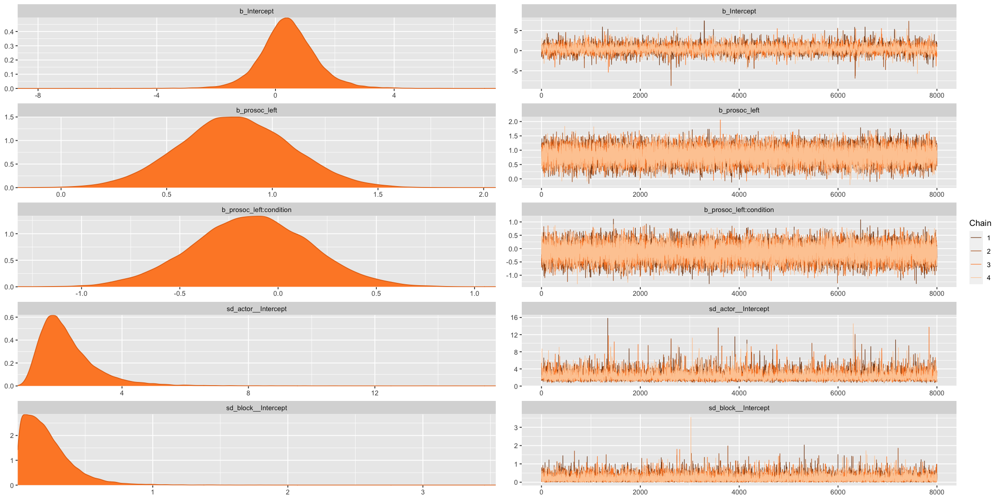

In [43]:
plot(b12.5)

Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.



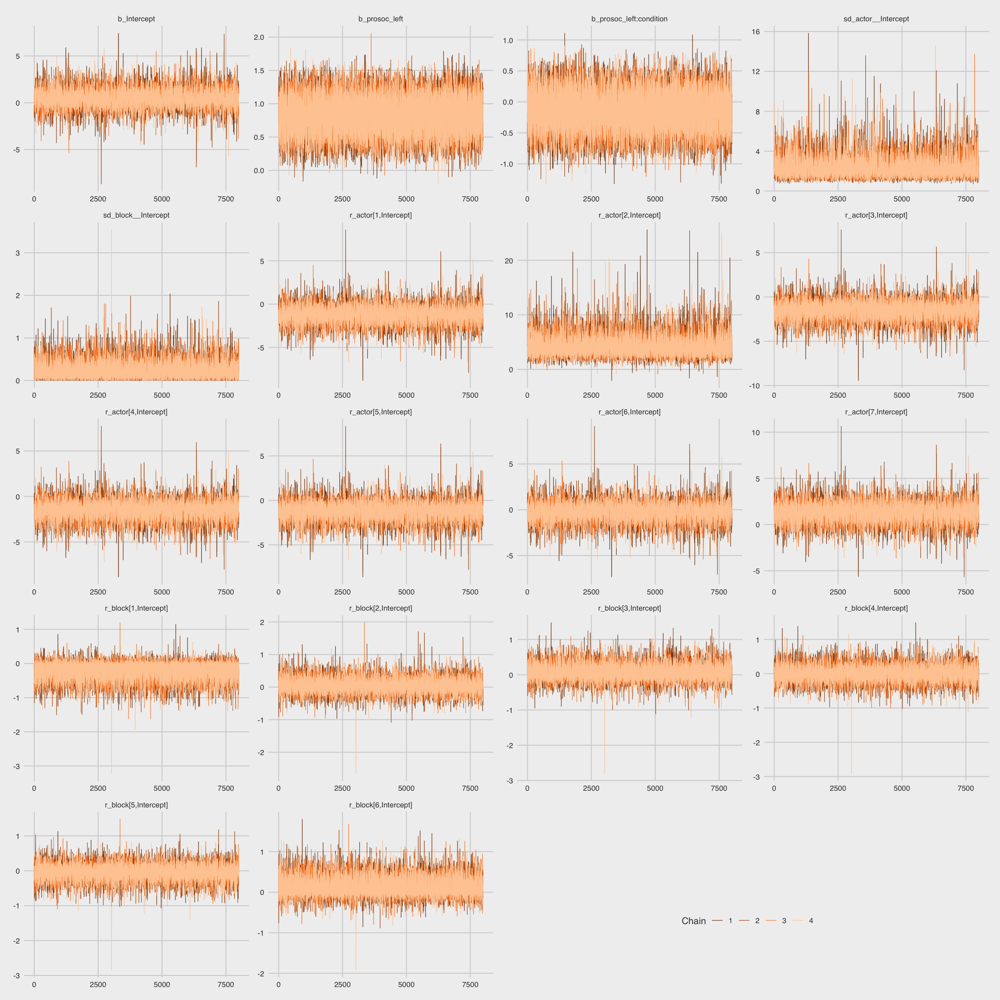

In [49]:
options(repr.plot.width=18, repr.plot.height=18)

library(bayesplot)
color_scheme_set("orange")

post <- posterior_samples(b12.5, add_chain = T)

post %>% 
  select(-lp__, -iter) %>% 
  mcmc_trace(facet_args = list(ncol = 4)) +
  scale_x_continuous(breaks = c(0, 2500, 5000, 7500)) +
  theme_fivethirtyeight() +
  theme(legend.position = c(.75, .06))

检查`有效样本数/总样本`，此处是0.1

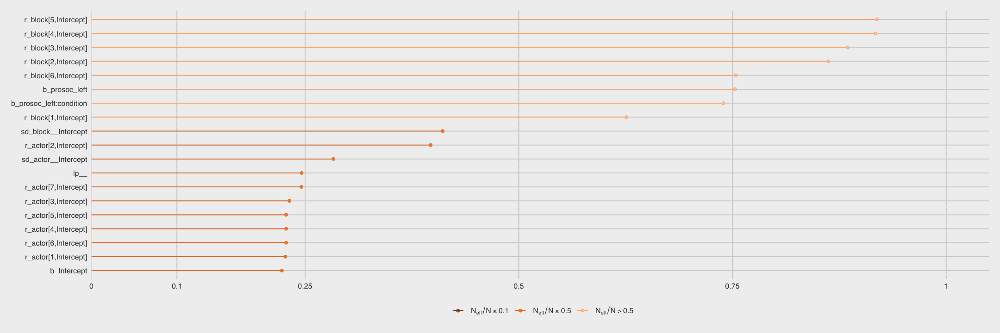

In [47]:
options(repr.plot.width=18, repr.plot.height=6)

neff_ratio(b12.5) %>% 
  mcmc_neff() +
  theme_fivethirtyeight()

In [52]:
ranef(b12.5)$actor[, , "Intercept"] %>% 
  round(digits = 2)

ranef(b12.5)$block[, , "Intercept"] %>% 
  round(digits = 2)

,Estimate,Est.Error,Q2.5,Q97.5
1,-1.15,0.98,-3.17,0.72
2,4.22,1.70,1.81,8.28
3,-1.45,0.98,-3.49,0.40
4,-1.46,0.98,-3.50,0.40
5,-1.15,0.98,-3.19,0.69
6,-0.20,0.98,-2.24,1.66
7,1.34,1.00,-0.70,3.29


,Estimate,Est.Error,Q2.5,Q97.5
1,-0.18,0.23,-0.74,0.13
2,0.04,0.19,-0.33,0.45
3,0.05,0.19,-0.30,0.48
4,0.01,0.19,-0.39,0.40
5,-0.03,0.19,-0.46,0.34
6,0.11,0.20,-0.21,0.61


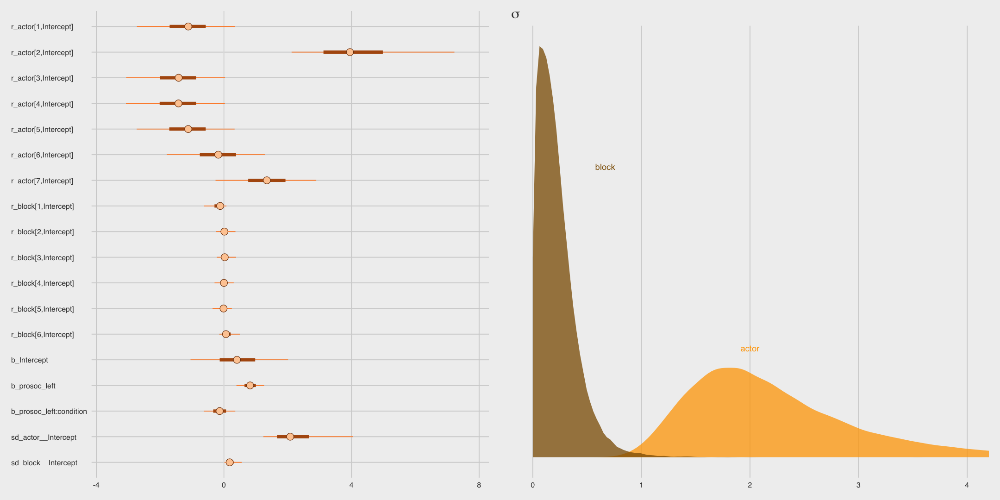

In [56]:
options(repr.plot.width=18, repr.plot.height=9)

p3 = mcmc_plot(b12.5, pars = c("^r_", "^b_", "^sd_")) +
  theme_fivethirtyeight() +
  theme(axis.text.y = element_text(hjust = 0))

p4 = post %>%
  ggplot(aes(x = sd_actor__Intercept)) +
  geom_density(size = 0, fill = "orange1", alpha = 3/4) +
  geom_density(aes(x = sd_block__Intercept), 
               size = 0, fill = "orange4", alpha = 3/4)  +
  scale_y_continuous(NULL, breaks = NULL) +
  coord_cartesian(xlim = c(0, 4)) +
  labs(title = expression(sigma)) +
  annotate("text", x = 2/3, y = 2, label = "block", color = "orange4") +
  annotate("text", x = 2, y = 3/4, label = "actor", color = "orange1") +
  theme_fivethirtyeight()

cowplot::plot_grid(p3, p4, ncol = 2)

相差不大

In [55]:
b12.4 <- add_criterion(b12.4, "loo")
b12.5 <- add_criterion(b12.5, "loo")

loo_compare(b12.4, b12.5) %>% 
  print(simplify = F)

      elpd_diff se_diff elpd_loo se_elpd_loo p_loo  se_p_loo looic  se_looic
b12.4    0.0       0.0  -265.7      9.8         8.1    0.4    531.4   19.5  
b12.5   -0.6       0.9  -266.3      9.8        10.4    0.5    532.7   19.7  


# 多重模型后验预测

## 原类别后验预测
使用`fitted()`函数进行查验

In [9]:
chimp <- 2    #选择第二只黑猩猩
nd <-
  tibble(prosoc_left = c(0, 1, 0, 1),
         condition   = c(0, 0, 1, 1),
         actor       = chimp)

(
  chimp_2_fitted <-
  fitted(b12.4,
         newdata = nd) %>% 
  as_tibble() %>% 
  mutate(condition = factor(c("0/0", "1/0", "0/1", "1/1"), 
                            levels = c("0/0", "1/0", "0/1", "1/1")))
  )

Estimate,Est.Error,Q2.5,Q97.5,condition
<dbl>,<dbl>,<dbl>,<dbl>,<fct>
0.9804486,0.01972748,0.9280571,0.9998023,0/0
0.9910761,0.00943063,0.9654555,0.9999146,1/0
0.9804486,0.01972748,0.9280571,0.9998023,0/1
0.9898267,0.01073866,0.9607920,0.9999008,1/1


In [10]:
(
  chimp_2_d <-
  d %>% 
  filter(actor == chimp) %>% 
  group_by(prosoc_left, condition) %>% 
  summarise(prob = mean(pulled_left)) %>% 
  ungroup() %>% 
  mutate(condition = str_c(prosoc_left, "/", condition)) %>% 
  mutate(condition = factor(condition, levels = c("0/0", "1/0", "0/1", "1/1")))
)

prosoc_left,condition,prob
<int>,<fct>,<dbl>
0,0/0,1
0,0/1,1
1,1/0,1
1,1/1,1


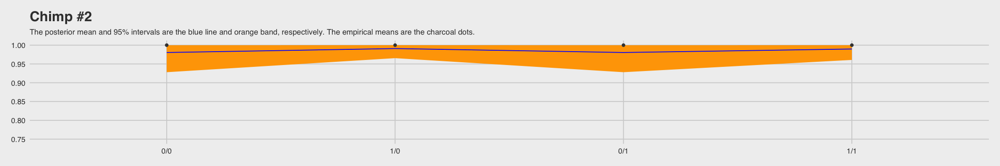

In [13]:
options(repr.plot.width=18, repr.plot.height=3)

chimp_2_fitted %>%
  # if you want to use `geom_line()` or `geom_ribbon()` with a factor on the x axis,
  # you need to code something like `group = 1` in `aes()`
  ggplot(aes(x = condition, y = Estimate, group = 1)) +
  geom_ribbon(aes(ymin = Q2.5, ymax = Q97.5), fill = "orange1") +
  geom_line(color = "blue") +
  geom_point(data = chimp_2_d,
             aes(y = prob),
             color = "grey25") +
  ggtitle("Chimp #2",
          subtitle = "The posterior mean and 95% intervals are the blue line and orange band, respectively. The empirical means are the charcoal dots.") +
  coord_cartesian(ylim = c(.75, 1)) +
  theme_fivethirtyeight() +
  theme(plot.subtitle = element_text(size = 10))

In [14]:
post <- posterior_samples(b12.4)

glimpse(post)

Observations: 32,000
Variables: 12
$ b_Intercept               <dbl> 0.37682973, 1.36998230, 1.45526136, 1.3436…
$ b_prosoc_left             <dbl> 0.6047862, 0.6148346, 0.5634250, 0.4242934…
$ `b_prosoc_left:condition` <dbl> -0.20211486, 0.59031369, 0.38477279, -0.09…
$ sd_actor__Intercept       <dbl> 1.838943, 1.864909, 1.826238, 1.389767, 1.…
$ `r_actor[1,Intercept]`    <dbl> -0.794008255, -1.984467829, -1.733568219, …
$ `r_actor[2,Intercept]`    <dbl> 3.1235681, 2.9424313, 3.0468049, 3.6422608…
$ `r_actor[3,Intercept]`    <dbl> -1.39693082, -2.66393932, -2.10739161, -2.…
$ `r_actor[4,Intercept]`    <dbl> -1.7874356, -1.9561667, -3.0281412, -1.547…
$ `r_actor[5,Intercept]`    <dbl> -1.00366854, -2.11103528, -1.73704297, -2.…
$ `r_actor[6,Intercept]`    <dbl> -0.40733147, -0.89851421, -1.31855605, -0.…
$ `r_actor[7,Intercept]`    <dbl> 1.39543070, 0.22421531, 0.37255945, 0.4514…
$ lp__                      <dbl> -282.6916, -285.6740, -287.4757, -287.1836…


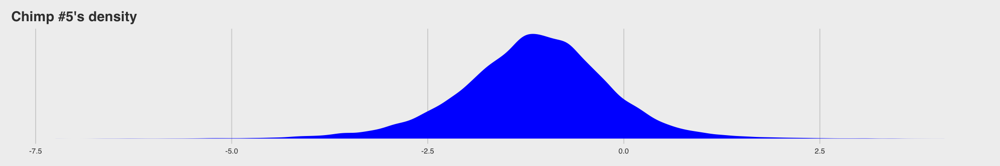

In [15]:
post %>%
  transmute(actor_5 = `r_actor[5,Intercept]`) %>%          # 获取第 5 只黑猩猩的所有后验样本
  
  ggplot(aes(x = actor_5)) +
  geom_density(size = 0, fill = "blue") +
  scale_y_continuous(breaks = NULL) +
  ggtitle("Chimp #5's density") +
  theme_fivethirtyeight()

In [16]:
# our hand-made `brms::fitted()` alternative
my_fitted <- function(prosoc_left, condition){
  post %>%
    transmute(fitted = (b_Intercept + 
                          `r_actor[5,Intercept]` + 
                          b_prosoc_left * prosoc_left + 
                          `b_prosoc_left:condition` * prosoc_left * condition) %>% 
                inv_logit_scaled())
}

# the posterior summaries
(
  chimp_5_my_fitted <-
  tibble(prosoc_left = c(0, 1, 0, 1),
       condition     = c(0, 0, 1, 1)) %>% 
  mutate(post = map2(prosoc_left, condition, my_fitted)) %>% 
  unnest() %>% 
  mutate(condition = str_c(prosoc_left, "/", condition)) %>% 
  mutate(condition = factor(condition, levels = c("0/0", "1/0", "0/1", "1/1"))) %>% 
  group_by(condition) %>% 
  tidybayes::mean_qi(fitted)
  )

Warning message:
“`cols` is now required.
Please use `cols = c(post)`”


condition,fitted,.lower,.upper,.width,.point,.interval
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
0/0,0.3319543,0.2248942,0.4522104,0.95,mean,qi
1/0,0.5276612,0.3823191,0.6696140,0.95,mean,qi
0/1,0.3319543,0.2248942,0.4522104,0.95,mean,qi
1/1,0.4947758,0.3519448,0.6373142,0.95,mean,qi


In [17]:
chimp <- 5
(
  chimp_5_d <-
  d %>% 
  filter(actor == chimp) %>% 
  group_by(prosoc_left, condition) %>% 
  summarise(prob = mean(pulled_left)) %>% 
  ungroup() %>% 
  mutate(condition = str_c(prosoc_left, "/", condition)) %>% 
  mutate(condition = factor(condition, levels = c("0/0", "1/0", "0/1", "1/1")))
)

prosoc_left,condition,prob
<int>,<fct>,<dbl>
0,0/0,0.3333333
0,0/1,0.2777778
1,1/0,0.5555556
1,1/1,0.5000000


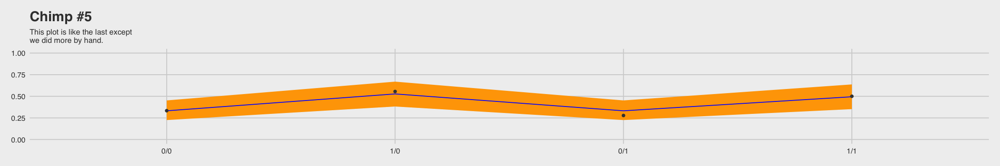

In [18]:
chimp_5_my_fitted %>%
  ggplot(aes(x = condition, y = fitted, group = 1)) +
  geom_ribbon(aes(ymin = .lower, ymax = .upper), fill = "orange1") +
  geom_line(color = "blue") +
  geom_point(data = chimp_5_d,
             aes(y = prob),
             color = "grey25") +
  ggtitle("Chimp #5",
          subtitle = "This plot is like the last except\nwe did more by hand.") +
  coord_cartesian(ylim = 0:1) +
  theme_fivethirtyeight() +
  theme(plot.subtitle = element_text(size = 10))

## 新类别后验预测
使用群体水平(固定效应)参数

In [20]:
post_average_actor <-
  post %>% 
  # 使用线性回归得到 4 个条件的对数几率 
  transmute(`0/0` = b_Intercept,
            `1/0` = b_Intercept + b_prosoc_left,
            `0/1` = b_Intercept,
            `1/1` = b_Intercept + b_prosoc_left + `b_prosoc_left:condition`) %>%
  # 使用 `mutate_all()` 将估计值转化为概率
  mutate_all(inv_logit_scaled) %>% 
  # putting the data in the long format and grouping by condition (i.e., `key`)
  gather() %>%
  mutate(key = factor(key, level = c("0/0", "1/0", "0/1", "1/1"))) %>% 
  group_by(key) %>%
  # here we get the summary values for the plot
  summarise(m  = mean(value),
            # note we're using 95% intervals
            ll = quantile(value, probs = .025),
            ul = quantile(value, probs = .975))

post_average_actor

key,m,ll,ul
<fct>,<dbl>,<dbl>,<dbl>
0/0,0.5894506,0.1992264,0.9221960
1/0,0.7443138,0.3550219,0.9647360
0/1,0.5894506,0.1992264,0.9221960
1/1,0.7214584,0.3243159,0.9597082


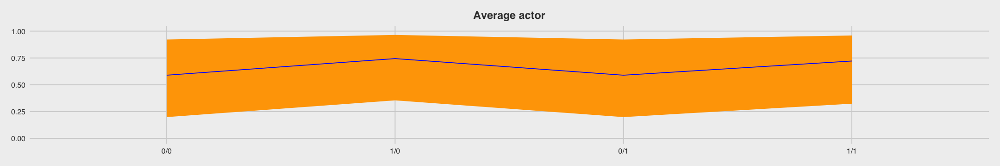

In [21]:
p1 <-
  post_average_actor %>%
  ggplot(aes(x = key, y = m, group = 1)) +
  geom_ribbon(aes(ymin = ll, ymax = ul), fill = "orange1") +
  geom_line(color = "blue") +
  ggtitle("Average actor") +
  coord_cartesian(ylim = 0:1) +
  theme_fivethirtyeight() +
  theme(plot.title = element_text(size = 14, hjust = .5))

p1

将变化截距参数 `a_actor` 设置为 0 能够得到一般黑猩猩的预测值。这些预测忽略了黑猩猩之间的差异导致的不确定性

In [22]:
# 随机效应
set.seed(12.42)
ran_ef <-
  tibble(random_effect = rnorm(n = 1000, mean = 0, sd = post$sd_actor__Intercept)) %>% 
  #通过 `., ., ., .` 重复前一行操作
  bind_rows(., ., ., .) 

# 固定效应 (i.e., the population parameters)
fix_ef <-
  post %>% 
  slice(1:1000) %>%
  transmute(`0/0` = b_Intercept,
            `1/0` = b_Intercept + b_prosoc_left,
            `0/1` = b_Intercept,
            `1/1` = b_Intercept + b_prosoc_left + `b_prosoc_left:condition`) %>%
  gather() %>%
  rename(condition    = key, 
         fixed_effect = value) %>% 
  mutate(condition = factor(condition, level = c("0/0", "1/0", "0/1", "1/1")))

# combine them
ran_and_fix_ef <-
  bind_cols(ran_ef, fix_ef) %>%
  mutate(intercept = fixed_effect + random_effect) %>%
  mutate(prob      = inv_logit_scaled(intercept))

# to simplify things, we'll reduce them to summaries
(
  marginal_effects <-
  ran_and_fix_ef %>%
  group_by(condition) %>%
  summarise(m  = mean(prob),
            ll = quantile(prob, probs = .1),
            ul = quantile(prob, probs = .9))
  )

condition,m,ll,ul
<fct>,<dbl>,<dbl>,<dbl>
0/0,0.5676799,0.0813372,0.9683068
1/0,0.6776065,0.1636455,0.9851760
0/1,0.5676799,0.0813372,0.9683068
1/1,0.6596661,0.1494227,0.9835574


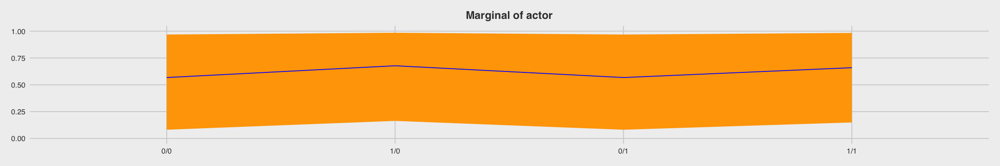

In [23]:
p2 <-
  marginal_effects %>%
  ggplot(aes(x = condition, y = m, group = 1)) +
  geom_ribbon(aes(ymin = ll, ymax = ul), fill = "orange1") +
  geom_line(color = "blue") +
  ggtitle("Marginal of actor") +
  coord_cartesian(ylim = 0:1) +
  theme_fivethirtyeight() +
  theme(plot.title = element_text(size = 14, hjust = .5))

p2

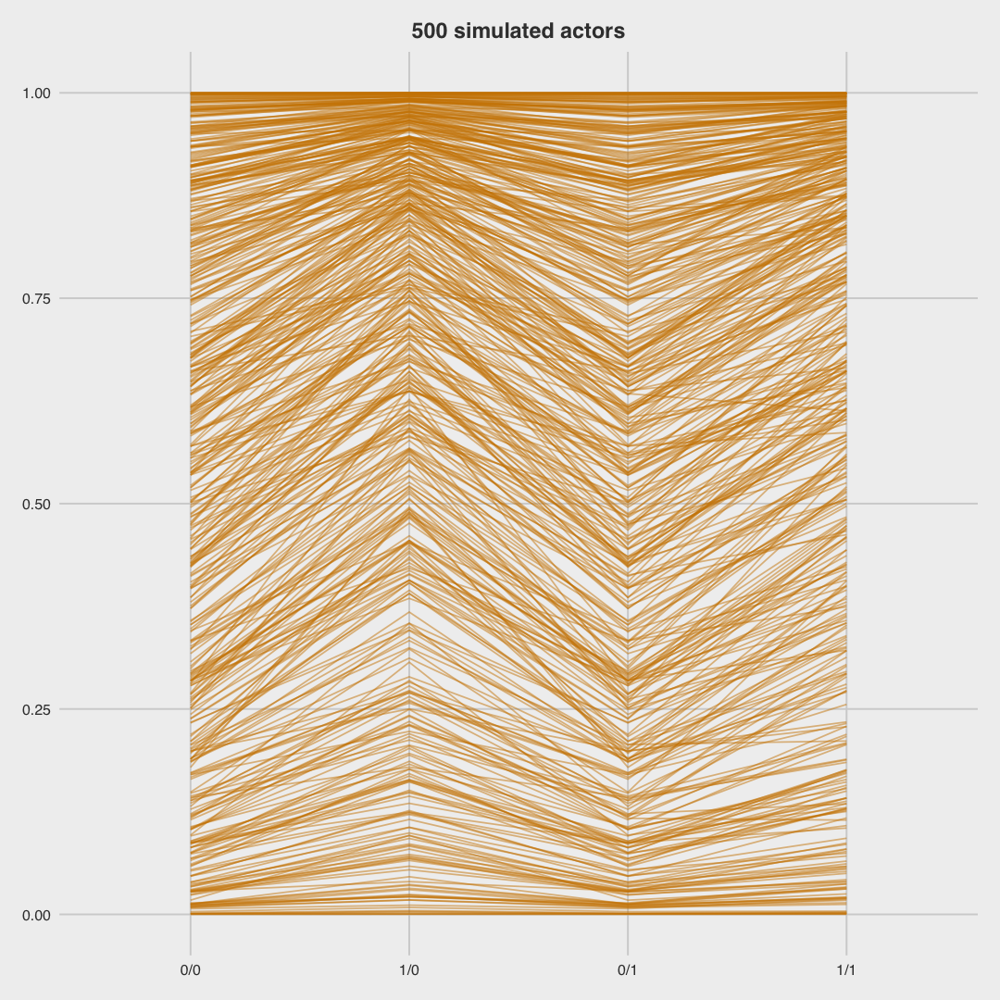

In [30]:
options(repr.plot.width=9, repr.plot.height=9)
p3 <-
  ran_and_fix_ef %>%
  mutate(iter = rep(1:1000, times = 4)) %>%
  filter(iter %in% c(1:500)) %>%
  
  ggplot(aes(x = condition, y = prob, group = iter)) +
  theme_fivethirtyeight() +
  ggtitle("500 simulated actors") +
  coord_cartesian(ylim = 0:1) +
  geom_line(alpha = 1/2, color = "orange3") +
  theme(plot.title = element_text(size = 14, hjust = .5))

p3

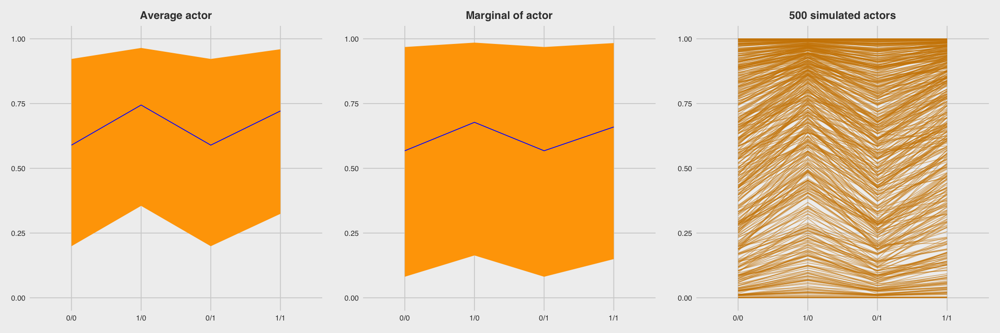

In [32]:
library(gridExtra)
options(repr.plot.width=18, repr.plot.height=6)
grid.arrange(p1, p2, p3, ncol = 3)

我们只是使用`post`的不同版本，即`posterior_samples(b.12.4)`返回的数据帧来绘制这些图。如果你仔细看的话，你会发现这是一个很好的练习，它迫使你去思考，相对于模型公式，`post`中的各种向量意味着什么。但是，从另一个角度看如何做到这一点也很方便。因此，下面我们将通过依赖于`fitting()`函数来重复这个过程。我们将以相同的顺序，从普通`actor`开始。

## 使用`fitted`

In [36]:
# nd <-
#   tibble(prosoc_left = c(0, 1, 0, 1),
#          condition   = c(0, 0, 1, 1),
#          actor       = chimp)

# (
#   chimp_2_fitted <-
#   fitted(b12.4,
#          newdata = nd) %>% 
#   as_tibble() %>% 
#   mutate(condition = factor(c("0/0", "1/0", "0/1", "1/1"), 
#                             levels = c("0/0", "1/0", "0/1", "1/1")))
#   )



nd <-
  tibble(prosoc_left = c(0, 1, 0, 1),
         condition   = c(0, 0, 1, 1))

(
  f <-
  fitted(b12.4,
         newdata = nd,
         re_formula = NA,
         probs = c(.025, .975)) %>% 
  as_tibble() %>% 
  bind_cols(nd) %>% 
  mutate(condition = str_c(prosoc_left, "/", condition) %>% 
           factor(., levels = c("0/0", "1/0", "0/1", "1/1")))
  )

Estimate,Est.Error,Q2.5,Q97.5,prosoc_left,condition
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
0.5894506,0.1872047,0.1992264,0.9221960,0,0/0
0.7443138,0.1572090,0.3550219,0.9647360,1,1/0
0.5894506,0.1872047,0.1992264,0.9221960,0,0/1
0.7214584,0.1642448,0.3243159,0.9597082,1,1/1


你应该注意到一些事情。由于`b12.4`是一个多层模型，有三个预测变量：`prosoc_left`、`condition`和`actor`。然而，我们的`nd数`据只包含前两个预测因子。之所以允许使用`fitted()`是因为我们设置了`re_formula = NA`。即设置`fitted()`忽略组水平效应(只专注于固定效果)。这是我们的`fitted()`版本，忽略了`posterior_samples()`返回的`r_ vectors`

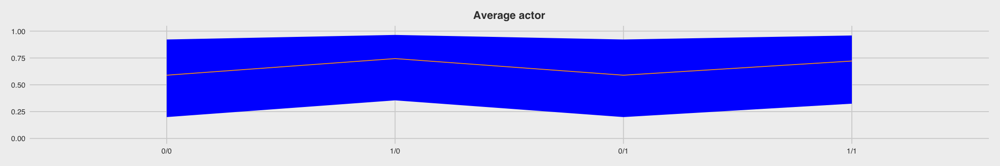

In [38]:
options(repr.plot.width=18, repr.plot.height=3)
p4 <-
  f %>%
  ggplot(aes(x = condition, y = Estimate, group = 1)) +
  geom_ribbon(aes(ymin = Q2.5, ymax = Q97.5), fill = "blue") +
  geom_line(color = "orange1") +
  ggtitle("Average actor") +
  coord_cartesian(ylim = 0:1) +
  theme_fivethirtyeight() +
  theme(plot.title = element_text(size = 14, hjust = .5))

p4

In [44]:
(
  f <-
  fitted(b12.4,
         newdata = nd,
         probs = c(.025, .975),
         allow_new_levels = T,
         sample_new_levels = "gaussian") %>% 
  as_tibble() %>% 
  bind_cols(nd) %>% 
  mutate(condition = str_c(prosoc_left, "/", condition) %>% 
           factor(., levels = c("0/0", "1/0", "0/1", "1/1")))
  )

Estimate,Est.Error,Q2.5,Q97.5,prosoc_left,condition
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
0.5564734,0.3289798,0.009130983,0.9970558,0,0/0
0.6660818,0.3096487,0.021077609,0.9986913,1,1/0
0.5564734,0.3289798,0.009130983,0.9970558,0,0/1
0.6489562,0.3141034,0.018219425,0.9985639,1,1/1


对于边缘`actor`，可以继续使用相同的`nd`数据。这一次，我们将坚持使用默认的`re_formula`设置，它将适应多层模型的特性。此外还将添加`allow_new_levels = T`和s`ample_new_levels = "gaussian"`。前者将允许我们在数据中的对于特定`actor`进行边缘化，而后者将指示` fitted()`使用随机效应所暗示的多元正态分布。在下一章结束时，我说多元正态分布会更有意义

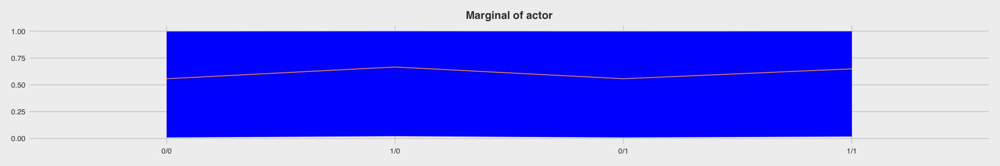

In [45]:
p5 <-
  f %>%
  ggplot(aes(x = condition, y = Estimate, group = 1)) +
  geom_ribbon(aes(ymin = Q2.5, ymax = Q97.5), fill = "blue") +
  geom_line(color = "orange1") +
  ggtitle("Marginal of actor") +
  coord_cartesian(ylim = 0:1) +
  theme_fivethirtyeight() +
  theme(plot.title = element_text(size = 14, hjust = .5))

p5

In [47]:
# how many simulated actors would you like?
n_sim <- 500

(
  f <-
  fitted(b12.4,
         newdata = nd,
         probs = c(.1, .9),
         allow_new_levels = T,
         sample_new_levels = "gaussian",
         summary = F,
         nsamples = n_sim) %>% 
  as_tibble() %>% 
  mutate(iter = 1:n_sim) %>% 
  gather(key, value, -iter) %>% 
  bind_cols(nd %>% 
              transmute(condition = str_c(prosoc_left, "/", condition) %>% 
                          factor(., levels = c("0/0", "1/0", "0/1", "1/1"))) %>% 
              expand(condition, iter = 1:n_sim))
  )

iter,key,value,condition,iter1
<int>,<chr>,<dbl>,<fct>,<int>
1,V1,6.030613e-01,0/0,1
2,V1,8.240546e-02,0/0,2
3,V1,3.634662e-01,0/0,3
4,V1,9.434522e-02,0/0,4
5,V1,9.480837e-01,0/0,5
6,V1,8.587817e-01,0/0,6
7,V1,2.514878e-01,0/0,7
8,V1,5.334389e-01,0/0,8
9,V1,1.114055e-01,0/0,9


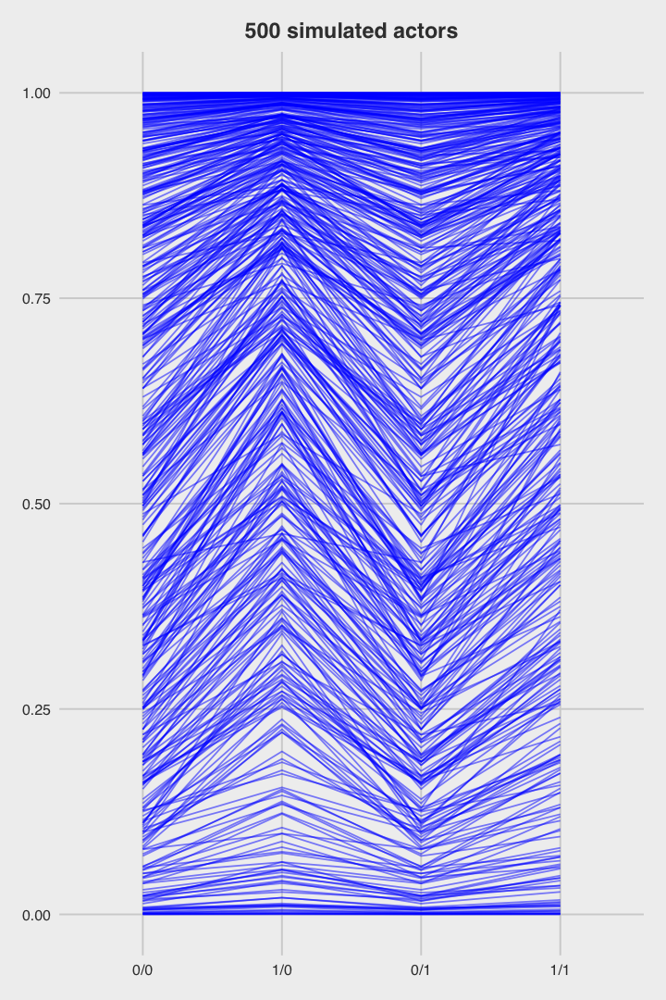

In [49]:
p6 <-
  f %>%
  
  ggplot(aes(x = condition, y = value, group = iter)) +
  geom_line(alpha = 1/2, color = "blue") +
  ggtitle("500 simulated actors") +
  coord_cartesian(ylim = 0:1) +
  theme_fivethirtyeight() +
  theme(plot.title = element_text(size = 14, hjust = .5))

options(repr.plot.width=6, repr.plot.height=9)
p6

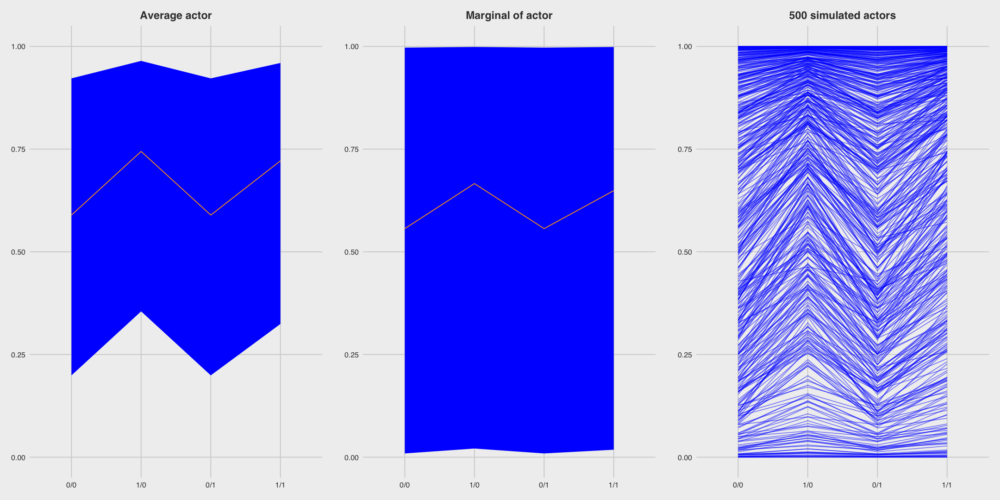

In [50]:
options(repr.plot.width=18, repr.plot.height=9)
grid.arrange(p4, p5, p6, ncol = 3)

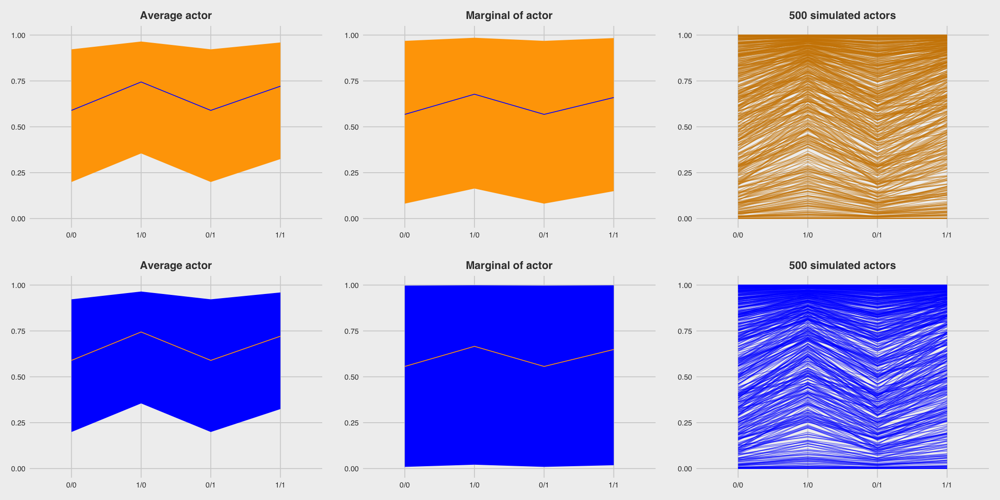

In [51]:
grid.arrange(p1, p2, p3, p4, p5, p6, ncol = 3, nrow = 2)

## 聚焦和分层模型

In [53]:
library(rethinking)
data(Kline)
d <- Kline
detach(package:rethinking, unload = T)
library(brms)
rm(Kline)
head(d)

rethinking (Version 1.95)


Attaching package: ‘rethinking’


The following object is masked from ‘package:purrr’:

    map


The following objects are masked from ‘package:brms’:

    LOO, stancode, WAIC


The following object is masked from ‘package:stats’:

    rstudent




,culture,population,contact,total_tools,mean_TU
,<fct>,<int>,<fct>,<int>,<dbl>
1,Malekula,1100,low,13,3.2
2,Tikopia,1500,low,22,4.7
3,Santa Cruz,3600,low,24,4.0
4,Yap,4791,high,43,5.0
5,Lau Fiji,7400,high,33,5.0
6,Trobriand,8000,high,19,4.0


\begin{aligned} T_{i} & \sim \text { Poisson }\left(\mu_{i}\right) \\ \log \left(\mu_{i}\right) &=\alpha+\alpha_{\text {SOCIETY}[i]}+\beta_{P} \log P_{i} \\ \alpha & \sim \operatorname{Normal}(0,10) \\ \beta_{P} & \sim \operatorname{Normal}(0,1) \\ \alpha_{\text {SOCIETY}} & \sim \operatorname{Normal}\left(0, \sigma_{\text {SOCIETY}}\right) \\ \sigma_{\text {SOCIETY}} & \sim \text { HalfCauchy }(0,1) \end{aligned}
使用`0 + intercept`语句而非采用默认截距(固定效应)，这是因为我们的预测变量并未进行均值中心化。但这一操作对随机效应并非必须

In [54]:
b12.6 <- 
  brm(data = d, family = poisson,
      total_tools ~ 0 + intercept + log(population) + 
        (1 | culture),
      prior = c(prior(normal(0, 10), class = b, coef = intercept),
                prior(normal(0, 1), class = b),
                prior(cauchy(0, 1), class = sd)),
      iter = 10000, warmup = 5000, cores = 4, chains = 4,
      seed = 12)

print(b12.6)

system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

Warning message:
“Reserved variable name 'intercept' is deprecated. Please use 'Intercept' instead.”
Compiling the C++ model

Start sampling



 Family: poisson 
  Links: mu = log 
Formula: total_tools ~ 0 + intercept + log(population) + (1 | culture) 
   Data: d (Number of observations: 10) 
Samples: 4 chains, each with iter = 10000; warmup = 5000; thin = 1;
         total post-warmup samples = 20000

Group-Level Effects: 
~culture (Number of levels: 10) 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sd(Intercept)     0.31      0.13     0.12     0.62 1.00     4714     6427

Population-Level Effects: 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
intercept         1.09      0.74    -0.46     2.54 1.00     5148     5934
logpopulation     0.26      0.08     0.10     0.43 1.00     5191     5830

Samples were drawn using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).


In [55]:
nd <- 
  tibble(population = seq(from = 1000, to = 400000, by = 5000),
         # 为了通过超参模拟社会数据，添加 `my_islan` 数据列到拟合数据后
         culture    = "my_island") 

p <-
  predict(b12.6,
          # 对 "my_island" 进行反事实数据模拟
          allow_new_levels = T,
          # 告知 brms 希望包含组水平效应
          re_formula = ~ (1 | culture),
          # from the brms manual, this uses the "(multivariate) normal distribution implied by 
          # the group-level standard deviations and correlations"
          sample_new_levels = "gaussian",
          newdata = nd,
          probs = c(.015, .055, .165, .835, .945, .985)) %>%
  as_tibble() %>%
  bind_cols(nd)

p %>%  
  glimpse()

Warning message:
“Reserved variable name 'intercept' is deprecated. Please use 'Intercept' instead.”
Warning message:
“Reserved variable name 'intercept' is deprecated. Please use 'Intercept' instead.”


Observations: 80
Variables: 10
$ Estimate   <dbl> 19.72160, 31.00220, 36.26010, 40.06945, 43.04775, 45.6336…
$ Est.Error  <dbl> 9.823814, 13.472285, 15.576100, 17.183038, 18.613667, 19.…
$ Q1.5       <dbl> 5.000, 10.000, 12.000, 14.000, 15.000, 16.000, 16.000, 17…
$ Q5.5       <dbl> 8.000, 15.000, 17.945, 19.000, 21.000, 22.000, 23.000, 24…
$ Q16.5      <dbl> 12, 20, 23, 26, 28, 30, 31, 32, 33, 34, 35, 36, 37, 37, 3…
$ Q83.5      <dbl> 27, 41, 48, 52, 56, 60, 63, 65, 68, 70, 72, 74, 76, 78, 7…
$ Q94.5      <dbl> 35.000, 52.000, 61.000, 68.000, 73.000, 77.000, 81.000, 8…
$ Q98.5      <dbl> 48.000, 70.000, 81.000, 90.000, 96.000, 104.000, 108.000,…
$ population <dbl> 1000, 6000, 11000, 16000, 21000, 26000, 31000, 36000, 410…
$ culture    <chr> "my_island", "my_island", "my_island", "my_island", "my_i…


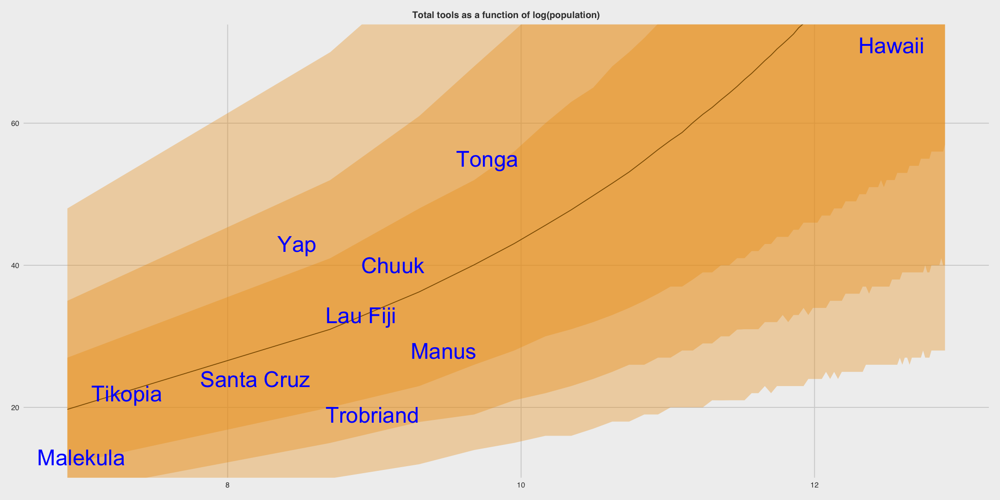

In [58]:
options(repr.plot.width=18, repr.plot.height=9)

p %>%
  ggplot(aes(x = log(population), y = Estimate)) +                                 # 绘制原始数据
  geom_ribbon(aes(ymin = Q1.5,  ymax = Q98.5), fill = "orange2", alpha = 1/3) +    # 后验中位数
  geom_ribbon(aes(ymin = Q5.5,  ymax = Q94.5), fill = "orange2", alpha = 1/3) +
  geom_ribbon(aes(ymin = Q16.5, ymax = Q83.5), fill = "orange2", alpha = 1/3) +
  geom_line(color = "orange4") +
  geom_text(data = d, aes(y = total_tools, label = culture), 
            size = 10, color = "blue") +
  ggtitle("Total tools as a function of log(population)") +
  coord_cartesian(ylim = range(d$total_tools)) +
  theme_fivethirtyeight() +
  theme(plot.title = element_text(size = 12, hjust = .5))

# tidybayes::spread_draws()
集中在如何将固定效应与存在组水平效应的多层模型结合起来。给定一个二项式变量：
\begin{aligned} \text { criterion }_{i} & \sim \text { Binomial }\left(n_{i} \geq 1, p_{i}\right) \\ \operatorname{logit}\left(p_{i}\right) &=\alpha+\alpha_{\text {grouping variable }_{i}} \\ \alpha & \sim \operatorname{Normal}(0,1) \\ \alpha_{\text {grouping variable }} & \sim \text { Normal }\left(0, \sigma_{\text {grouping variable }}\right) \\ \sigma_{\text {grouping variable }} & \sim \text { HalfCauchy }(0,1) \end{aligned}

## 只含有1-2组变量的截距模型

In [64]:
b12.4$formula

pulled_left | trials(1) ~ 1 + prosoc_left + prosoc_left:condition + (1 | actor) 

除了黑猩猩个体（即`actor`）的模型截距和随机效应外，我们还对研究condition的固定效应进行建模。如果我们将其简化为一个简单的只包含截距截的模型，并使用唯一的`actor`分组因子，那么将会更加简单
\begin{aligned} \text { pulled left }_{i} & \sim \text { Binomial }\left(n_{i}=1, p_{i}\right) \\ \operatorname{logit}\left(p_{i}\right) &=\alpha+\alpha_{\text {actor }} \\ \alpha & \sim \operatorname{Normal}(0,10) \\ \alpha_{\text {actor }} & \sim \operatorname{Normal}\left(0, \sigma_{\text {actor }}\right) \\ \sigma_{\text {actor }} & \sim \text { HalfCauchy }(0,1) \end{aligned}

In [65]:
b12.4$data %>% 
  glimpse()

Observations: 504
Variables: 4
$ pulled_left <int> 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1,…
$ prosoc_left <int> 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1,…
$ condition   <int> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ actor       <int> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,…


模型拟合之前,您可能还记得(a)我们在将数据保存为`d`之后删除了黑猩猩数据，和(b)我们随后将`Kline`赋值给`d`。检查确认数据已被保存至`b12.4`

In [11]:
b12.7 <- 
  brm(data = b12.4$data, family = binomial,
      pulled_left | trials(1) ~ 1 + (1 | actor),
      prior = c(prior(normal(0, 10), class = Intercept),
                prior(cauchy(0, 1), class = sd)),
      iter = 10000, warmup = 2000, chains = 4, cores = 4,
      control = list(adapt_delta = 0.95),
      seed = 12)

print(b12.7)

system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

Only 2 levels detected so that family 'bernoulli' might be a more efficient choice.

Compiling the C++ model

Start sampling



 Family: binomial 
  Links: mu = logit 
Formula: pulled_left | trials(1) ~ 1 + (1 | actor) 
   Data: b12.4$data (Number of observations: 504) 
Samples: 4 chains, each with iter = 10000; warmup = 2000; thin = 1;
         total post-warmup samples = 32000

Group-Level Effects: 
~actor (Number of levels: 7) 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sd(Intercept)     2.22      0.89     1.09     4.50 1.00     5650     8704

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     0.79      0.93    -0.99     2.79 1.00     5095     6557

Samples were drawn using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).


In [69]:
b12.5$formula

pulled_left | trials(1) ~ prosoc_left + (1 | actor) + (1 | block) + prosoc_left:condition 

In [8]:
b12.5$data %>% 
  glimpse()

Observations: 504
Variables: 5
$ pulled_left <int> 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1,…
$ prosoc_left <int> 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1,…
$ condition   <int> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ actor       <int> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,…
$ block       <int> 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 4,…


\begin{aligned} \text { pulled left }_{i} & \sim \text { Binomial }\left(n_{i}=1, p_{i}\right) \\ \operatorname{logit}\left(p_{i}\right) &=\alpha+\alpha_{\text {actor}_i}+\alpha_{\text {block }_{i}} \\ \alpha & \sim \operatorname{Normal}(0,10) \\ \alpha_{\text {actor }} & \sim \operatorname{Normal}\left(0, \sigma_{\text {actor }}\right) \\ \alpha_{\text {block }} & \sim \operatorname{Normal}\left(0, \sigma_{\text {block }}\right) \\ \sigma_{\text {actor }} & \sim \text { HalfCauchy }(0,1) \\ \sigma_{\text {block }} & \sim \text { HalfCauchy }(0,1) \end{aligned}

In [9]:
b12.8 <- 
  brm(data = b12.5$data, family = binomial,
      pulled_left | trials(1) ~ 1 + (1 | actor) + (1 | block),
      prior = c(prior(normal(0, 10), class = Intercept),
                prior(cauchy(0, 1), class = sd)),
      iter = 10000, warmup = 2000, chains = 4, cores = 4,
      control = list(adapt_delta = 0.95),
      seed = 12)

print(b12.8)

system("osascript -e \'display notification \"程序\" with title \"跑完了\"\'")
beepr::beep(sound = 4)

Only 2 levels detected so that family 'bernoulli' might be a more efficient choice.

Compiling the C++ model

Start sampling



 Family: binomial 
  Links: mu = logit 
Formula: pulled_left | trials(1) ~ 1 + (1 | actor) + (1 | block) 
   Data: b12.5$data (Number of observations: 504) 
Samples: 4 chains, each with iter = 10000; warmup = 2000; thin = 1;
         total post-warmup samples = 32000

Group-Level Effects: 
~actor (Number of levels: 7) 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sd(Intercept)     2.25      0.94     1.10     4.64 1.00     9151    13394

~block (Number of levels: 6) 
              Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sd(Intercept)     0.22      0.18     0.01     0.67 1.00    10966    13998

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     0.81      0.95    -0.98     2.87 1.00     7410    11369

Samples were drawn using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains

四种处理后验样本的方法：
- `brms::posterior_samples()`
- `brms::coef()`
- `brms::fitted()`
- `tidybayes::spread_draws()`

练习三种不同的模型summary：
- 从b12.7模型中获取`actor`水平的后验估计
- 从交叉分类的b12.8模型中获取`actor`水平的后验估计，对`block`水平作平均
- 从交叉分类的b12.8模型中获取`actor`水平的后验估计，基于`block == 1`(可变截距)

## brms::posterior_samples()

In [12]:
str(posterior_samples(b12.7))

'data.frame':	32000 obs. of  10 variables:
 $ b_Intercept         : num  1.153 1.212 0.992 1.005 1.036 ...
 $ sd_actor__Intercept : num  1.81 1.96 1.78 1.25 1.28 ...
 $ r_actor[1,Intercept]: num  -1.36 -1.6 -1.68 -1.7 -1.78 ...
 $ r_actor[2,Intercept]: num  4.23 3.98 3.42 3.16 3.66 ...
 $ r_actor[3,Intercept]: num  -1.82 -1.75 -1.32 -1.4 -1.35 ...
 $ r_actor[4,Intercept]: num  -1.75 -1.73 -1.57 -1.52 -1.62 ...
 $ r_actor[5,Intercept]: num  -1.59 -1.46 -1.62 -1.65 -1.6 ...
 $ r_actor[6,Intercept]: num  -0.277 -0.518 -0.489 -0.482 -0.549 ...
 $ r_actor[7,Intercept]: num  0.255 1.277 0.921 0.722 0.284 ...
 $ lp__                : num  -282 -279 -281 -285 -287 ...


In [17]:
posterior_samples(b12.7) %>% 
  transmute(`chimp 1's average probability of pulling left` = (b_Intercept + `r_actor[1,Intercept]`) %>%
            inv_logit_scaled()) %>% 
  head()

,chimp 1's average probability of pulling left
,<dbl>
1,0.4490154
2,0.4041661
3,0.3340135
4,0.3330431
5,0.3228662
6,0.4130218


b12.7中获取的后验对`actor`水平估计

In [14]:
p1 <-
  posterior_samples(b12.7) %>% 
  transmute(`chimp 1's average probability of pulling left` = b_Intercept + `r_actor[1,Intercept]`,
            `chimp 2's average probability of pulling left` = b_Intercept + `r_actor[2,Intercept]`,
            `chimp 3's average probability of pulling left` = b_Intercept + `r_actor[3,Intercept]`,
            `chimp 4's average probability of pulling left` = b_Intercept + `r_actor[4,Intercept]`,
            `chimp 5's average probability of pulling left` = b_Intercept + `r_actor[5,Intercept]`,
            `chimp 6's average probability of pulling left` = b_Intercept + `r_actor[6,Intercept]`,
            `chimp 7's average probability of pulling left` = b_Intercept + `r_actor[7,Intercept]`) %>% 
  mutate_all(inv_logit_scaled)

str(p1)

'data.frame':	32000 obs. of  7 variables:
 $ chimp 1's average probability of pulling left: num  0.449 0.404 0.334 0.333 0.323 ...
 $ chimp 2's average probability of pulling left: num  0.995 0.994 0.988 0.985 0.991 ...
 $ chimp 3's average probability of pulling left: num  0.34 0.368 0.419 0.403 0.422 ...
 $ chimp 4's average probability of pulling left: num  0.354 0.372 0.359 0.373 0.357 ...
 $ chimp 5's average probability of pulling left: num  0.393 0.439 0.347 0.343 0.362 ...
 $ chimp 6's average probability of pulling left: num  0.706 0.667 0.623 0.628 0.619 ...
 $ chimp 7's average probability of pulling left: num  0.803 0.923 0.871 0.849 0.789 ...


In [15]:
p2 <-
  posterior_samples(b12.8) %>% 
  transmute(`chimp 1's average probability of pulling left` = b_Intercept + `r_actor[1,Intercept]`,
            `chimp 2's average probability of pulling left` = b_Intercept + `r_actor[2,Intercept]`,
            `chimp 3's average probability of pulling left` = b_Intercept + `r_actor[3,Intercept]`,
            `chimp 4's average probability of pulling left` = b_Intercept + `r_actor[4,Intercept]`,
            `chimp 5's average probability of pulling left` = b_Intercept + `r_actor[5,Intercept]`,
            `chimp 6's average probability of pulling left` = b_Intercept + `r_actor[6,Intercept]`,
            `chimp 7's average probability of pulling left` = b_Intercept + `r_actor[7,Intercept]`) %>% 
  mutate_all(inv_logit_scaled)

str(p2)

'data.frame':	32000 obs. of  7 variables:
 $ chimp 1's average probability of pulling left: num  0.515 0.392 0.479 0.449 0.341 ...
 $ chimp 2's average probability of pulling left: num  0.992 0.984 0.991 0.982 0.963 ...
 $ chimp 3's average probability of pulling left: num  0.379 0.445 0.311 0.428 0.336 ...
 $ chimp 4's average probability of pulling left: num  0.413 0.343 0.367 0.386 0.363 ...
 $ chimp 5's average probability of pulling left: num  0.546 0.392 0.517 0.377 0.307 ...
 $ chimp 6's average probability of pulling left: num  0.764 0.711 0.6 0.752 0.712 ...
 $ chimp 7's average probability of pulling left: num  0.908 0.857 0.924 0.912 0.86 ...


b12.8的总体均值是跨`actor`和`block`的。如果`r_actor`和由`posterior_samples(b12.8)`返回的`r_block`向量都是有偏差的，那么执行`posterior_samples(b12.8) %>% glimpse()`可以补救。因此，如果我们简单地忽略`r_block`向量，我们就忽略了特定的`block`水平偏差，从而无法有效地对它们进行平均。
现在，对于我们的第三个任务，我们决定从基于`block == 1`从交叉分类的b12.8模型中检索`actor`水平的后验估计。为了得到第1个`block`的黑猩猩估计值，我们只需在每个公式后面加上`+ r_block[1,Intercept]`

In [16]:
p3 <-
  posterior_samples(b12.8) %>% 
  transmute(`chimp 1's average probability of pulling left` = b_Intercept + `r_actor[1,Intercept]` + `r_block[1,Intercept]`,
            `chimp 2's average probability of pulling left` = b_Intercept + `r_actor[2,Intercept]` + `r_block[1,Intercept]`,
            `chimp 3's average probability of pulling left` = b_Intercept + `r_actor[3,Intercept]` + `r_block[1,Intercept]`,
            `chimp 4's average probability of pulling left` = b_Intercept + `r_actor[4,Intercept]` + `r_block[1,Intercept]`,
            `chimp 5's average probability of pulling left` = b_Intercept + `r_actor[5,Intercept]` + `r_block[1,Intercept]`,
            `chimp 6's average probability of pulling left` = b_Intercept + `r_actor[6,Intercept]` + `r_block[1,Intercept]`,
            `chimp 7's average probability of pulling left` = b_Intercept + `r_actor[7,Intercept]` + `r_block[1,Intercept]`) %>% 
  mutate_all(inv_logit_scaled)

str(p3)

'data.frame':	32000 obs. of  7 variables:
 $ chimp 1's average probability of pulling left: num  0.388 0.384 0.474 0.433 0.332 ...
 $ chimp 2's average probability of pulling left: num  0.987 0.984 0.991 0.981 0.962 ...
 $ chimp 3's average probability of pulling left: num  0.267 0.436 0.307 0.412 0.326 ...
 $ chimp 4's average probability of pulling left: num  0.295 0.335 0.362 0.37 0.353 ...
 $ chimp 5's average probability of pulling left: num  0.417 0.383 0.512 0.361 0.298 ...
 $ chimp 6's average probability of pulling left: num  0.658 0.704 0.595 0.739 0.703 ...
 $ chimp 7's average probability of pulling left: num  0.854 0.852 0.922 0.906 0.854 ...


## brms::coef()

In [19]:
print(coef(b12.7))

$actor
, , Intercept

    Estimate Est.Error       Q2.5      Q97.5
1 -0.3219520 0.2411751 -0.7921918  0.1458806
2  4.8696964 1.5485226  2.8441600  8.7302927
3 -0.6128831 0.2477583 -1.1074491 -0.1341112
4 -0.6152111 0.2468352 -1.1073164 -0.1411209
5 -0.3222399 0.2384974 -0.7971810  0.1440084
6  0.5826169 0.2438807  0.1123296  1.0737337
7  2.0793291 0.3733595  1.4064040  2.8668551




默认情况下，我们会得到熟悉的7只黑猩猩操作均值的summary。当然，这些都在`log-odds`尺度下，使用`inv_logit_scaled()`还不算完。为了得到概率度量，我们要先设置`summary = F`以便直接处理未汇总的样本以观后效。注意`coef()`返回的是一个`list`，而不是一个`dataframe`

In [21]:
c1 <-
  coef(b12.7, summary = F)$actor[, , ] %>%
  as_tibble() %>% 
  gather() %>% 
  mutate(key   = str_c("chimp ", key, "'s average probability of pulling left"),
         value = inv_logit_scaled(value),
         # we need an iteration index for `spread()` to work properly
         iter  = rep(1:32000, times = 7)) %>% 
  spread(key = key, value = value)

str(c1)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  8 variables:
 $ iter                                         : int  1 2 3 4 5 6 7 8 9 10 ...
 $ chimp 1's average probability of pulling left: num  0.449 0.404 0.334 0.333 0.323 ...
 $ chimp 2's average probability of pulling left: num  0.995 0.994 0.988 0.985 0.991 ...
 $ chimp 3's average probability of pulling left: num  0.34 0.368 0.419 0.403 0.422 ...
 $ chimp 4's average probability of pulling left: num  0.354 0.372 0.359 0.373 0.357 ...
 $ chimp 5's average probability of pulling left: num  0.393 0.439 0.347 0.343 0.362 ...
 $ chimp 6's average probability of pulling left: num  0.706 0.667 0.623 0.628 0.619 ...
 $ chimp 7's average probability of pulling left: num  0.803 0.923 0.871 0.849 0.789 ...


In [22]:
c2 <-
  coef(b12.8, summary = F)$actor[, , ] %>%
  as_tibble() %>% 
  gather() %>% 
  mutate(key   = str_c("chimp ", key, "'s average probability of pulling left"),
         value = inv_logit_scaled(value),
         iter  = rep(1:32000, times = 7)) %>% 
  spread(key = key, value = value)

str(c2)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  8 variables:
 $ iter                                         : int  1 2 3 4 5 6 7 8 9 10 ...
 $ chimp 1's average probability of pulling left: num  0.515 0.392 0.479 0.449 0.341 ...
 $ chimp 2's average probability of pulling left: num  0.992 0.984 0.991 0.982 0.963 ...
 $ chimp 3's average probability of pulling left: num  0.379 0.445 0.311 0.428 0.336 ...
 $ chimp 4's average probability of pulling left: num  0.413 0.343 0.367 0.386 0.363 ...
 $ chimp 5's average probability of pulling left: num  0.546 0.392 0.517 0.377 0.307 ...
 $ chimp 6's average probability of pulling left: num  0.764 0.711 0.6 0.752 0.712 ...
 $ chimp 7's average probability of pulling left: num  0.908 0.857 0.924 0.912 0.86 ...


In [24]:
print(coef(b12.8))

$actor
, , Intercept

    Estimate Est.Error        Q2.5       Q97.5
1 -0.3268478 0.2670380 -0.86020079  0.19129231
2  4.9143281 1.5915121  2.84886885  8.82006535
3 -0.6195246 0.2721915 -1.16779365 -0.09366071
4 -0.6215091 0.2736349 -1.16313997 -0.09321980
5 -0.3279825 0.2657043 -0.85360167  0.18995985
6  0.5844105 0.2723581  0.05399241  1.11837473
7  2.0878515 0.3900534  1.36690123  2.89795583


$block
, , Intercept

   Estimate Est.Error       Q2.5    Q97.5
1 0.6240330 0.9672689 -1.1978430 2.694290
2 0.8621633 0.9563405 -0.9186723 2.922749
3 0.8630178 0.9559803 -0.9182564 2.926761
4 0.7921847 0.9531983 -0.9874782 2.827446
5 0.7926376 0.9575397 -0.9983036 2.850474
6 0.9126831 0.9588460 -0.8701986 2.970337




现在我们有一个包含两个元素的`list`，一个用于`actor`，另一个用于`block`。可能不是很明显的是，一个通过组水平返回的汇总是基于另一个组水平均值。虽然这使我们的第二个任务很容易，但是它为我们的第三个任务提供了一个挑战

In [27]:
print(ranef(b12.8))

$actor
, , Intercept

    Estimate Est.Error       Q2.5     Q97.5
1 -1.1334919 0.9659199 -3.2153733 0.6548723
2  4.1076840 1.6312917  1.7439871 7.9672576
3 -1.4261687 0.9676585 -3.5004369 0.3750008
4 -1.4281532 0.9672243 -3.5259502 0.3693900
5 -1.1346266 0.9664092 -3.2052461 0.6649602
6 -0.2222336 0.9681582 -2.3053546 1.5891868
7  1.2812074 0.9937709 -0.7990629 3.1996272


$block
, , Intercept

     Estimate Est.Error       Q2.5     Q97.5
1 -0.18261111 0.2295387 -0.7457643 0.1232039
2  0.05551912 0.1892663 -0.2966937 0.4927921
3  0.05637367 0.1857909 -0.2894100 0.4896736
4 -0.01445942 0.1823598 -0.4136900 0.3639707
5 -0.01400649 0.1853055 -0.4235544 0.3669034
6  0.10603895 0.2003764 -0.2197106 0.5845401




In [29]:
c3 <-
  coef(b12.8, summary = F)$actor[, , ] %>%
  as_tibble() %>% 
  gather() %>% 
  # here we add in the `block == 1` deviations from the grand mean
  mutate(value = value + ranef(b12.8, summary = F)$block[, 1, ] %>% rep(., times = 7)) %>% 
  mutate(key   = str_c("chimp ", key, "'s average probability of pulling left"),
         value = inv_logit_scaled(value),
         iter  = rep(1:32000, times = 7)) %>% 
  spread(key = key, value = value)

str(c3)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  8 variables:
 $ iter                                         : int  1 2 3 4 5 6 7 8 9 10 ...
 $ chimp 1's average probability of pulling left: num  0.388 0.384 0.474 0.433 0.332 ...
 $ chimp 2's average probability of pulling left: num  0.987 0.984 0.991 0.981 0.962 ...
 $ chimp 3's average probability of pulling left: num  0.267 0.436 0.307 0.412 0.326 ...
 $ chimp 4's average probability of pulling left: num  0.295 0.335 0.362 0.37 0.353 ...
 $ chimp 5's average probability of pulling left: num  0.417 0.383 0.512 0.361 0.298 ...
 $ chimp 6's average probability of pulling left: num  0.658 0.704 0.595 0.739 0.703 ...
 $ chimp 7's average probability of pulling left: num  0.854 0.852 0.922 0.906 0.854 ...


## brms::fitted()

In [30]:
(nd <- b12.7$data %>% distinct(actor))

actor
<int>
1
2
3
4
5
6
7


In [31]:
f1 <-
  fitted(b12.7,
         newdata = nd,
         summary = F,
         # within `fitted()`, this line does the same work that
         # `inv_logit_scaled()` did with the other two methods
         scale = "response") %>% 
  as_tibble() %>% 
  set_names(str_c("chimp ", 1:7, "'s average probability of pulling left"))

str(f1)

Warning message:
“`as_tibble.matrix()` requires a matrix with column names or a `.name_repair` argument. Using compatibility `.name_repair`.
This warning is displayed once per session.”


Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  7 variables:
 $ chimp 1's average probability of pulling left: num  0.449 0.404 0.334 0.333 0.323 ...
 $ chimp 2's average probability of pulling left: num  0.995 0.994 0.988 0.985 0.991 ...
 $ chimp 3's average probability of pulling left: num  0.34 0.368 0.419 0.403 0.422 ...
 $ chimp 4's average probability of pulling left: num  0.354 0.372 0.359 0.373 0.357 ...
 $ chimp 5's average probability of pulling left: num  0.393 0.439 0.347 0.343 0.362 ...
 $ chimp 6's average probability of pulling left: num  0.706 0.667 0.623 0.628 0.619 ...
 $ chimp 7's average probability of pulling left: num  0.803 0.923 0.871 0.849 0.789 ...


如果您要重命名的向量不遵循我们的序列顺序，则可能无法正常工作。如果您愿意多付几行处理的代码，则此方法较为通用，但仍可扩展

In [32]:
f1 <-
  fitted(b12.7,
         newdata = nd,
         summary = F,
         scale = "response") %>% 
  as_tibble() %>% 
  # you'll need this line to make the `spread()` line work properly
  mutate(iter = 1:n()) %>% 
  gather(key, value, -iter) %>% 
  mutate(key = str_replace(key, "V", "chimp ")) %>% 
  mutate(key = str_c(key, "'s average probability of pulling left")) %>% 
  spread(key = key, value = value)

str(f1)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  8 variables:
 $ iter                                         : int  1 2 3 4 5 6 7 8 9 10 ...
 $ chimp 1's average probability of pulling left: num  0.449 0.404 0.334 0.333 0.323 ...
 $ chimp 2's average probability of pulling left: num  0.995 0.994 0.988 0.985 0.991 ...
 $ chimp 3's average probability of pulling left: num  0.34 0.368 0.419 0.403 0.422 ...
 $ chimp 4's average probability of pulling left: num  0.354 0.372 0.359 0.373 0.357 ...
 $ chimp 5's average probability of pulling left: num  0.393 0.439 0.347 0.343 0.362 ...
 $ chimp 6's average probability of pulling left: num  0.706 0.667 0.623 0.628 0.619 ...
 $ chimp 7's average probability of pulling left: num  0.803 0.923 0.871 0.849 0.789 ...


In [33]:
f2 <-
  fitted(b12.8,
         newdata = nd,
         # this line allows us to average over the levels of `block`
         re_formula = pulled_left ~ 1 + (1 | actor),
         summary = F,
         scale = "response") %>% 
  as_tibble() %>% 
  set_names(str_c("chimp ", 1:7, "'s average probability of pulling left"))

str(f2)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  7 variables:
 $ chimp 1's average probability of pulling left: num  0.515 0.392 0.479 0.449 0.341 ...
 $ chimp 2's average probability of pulling left: num  0.992 0.984 0.991 0.982 0.963 ...
 $ chimp 3's average probability of pulling left: num  0.379 0.445 0.311 0.428 0.336 ...
 $ chimp 4's average probability of pulling left: num  0.413 0.343 0.367 0.386 0.363 ...
 $ chimp 5's average probability of pulling left: num  0.546 0.392 0.517 0.377 0.307 ...
 $ chimp 6's average probability of pulling left: num  0.764 0.711 0.6 0.752 0.712 ...
 $ chimp 7's average probability of pulling left: num  0.908 0.857 0.924 0.912 0.86 ...


In [34]:
(
  nd <-
  b12.8$data %>% 
  distinct(actor) %>% 
  mutate(block = 1)
  )

actor,block
<int>,<dbl>
1,1
2,1
3,1
4,1
5,1
6,1
7,1


In [35]:
f3 <-
  fitted(b12.8,
         newdata = nd,
         summary = F,
         scale = "response") %>% 
  as_tibble() %>% 
  set_names(str_c("chimp ", 1:7, "'s average probability of pulling left"))

str(f3)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  7 variables:
 $ chimp 1's average probability of pulling left: num  0.388 0.384 0.474 0.433 0.332 ...
 $ chimp 2's average probability of pulling left: num  0.987 0.984 0.991 0.981 0.962 ...
 $ chimp 3's average probability of pulling left: num  0.267 0.436 0.307 0.412 0.326 ...
 $ chimp 4's average probability of pulling left: num  0.295 0.335 0.362 0.37 0.353 ...
 $ chimp 5's average probability of pulling left: num  0.417 0.383 0.512 0.361 0.298 ...
 $ chimp 6's average probability of pulling left: num  0.658 0.704 0.595 0.739 0.703 ...
 $ chimp 7's average probability of pulling left: num  0.854 0.852 0.922 0.906 0.854 ...


## tidybayes::spread_draws()
首先，注意`tidybayes::spread_draw()`将模型本b12.7作为输入。不需要`posterior_samples()`。注意，我们给了它两个额外的参数。通过第一个参数，我们请求`spead_draw()`为`b_Intercept`提取后验样本。通过第二个参数`r_actor[actor，]`，我们指示`spead_draw()`为`actor`变量提取所有随机效应

In [42]:
library(tidybayes)

b12.7 %>%
  spread_draws(b_Intercept, r_actor[actor,])

.chain,.iteration,.draw,b_Intercept,actor,r_actor
<int>,<int>,<int>,<dbl>,<int>,<dbl>
1,1,1,1.1528391,1,-1.3574887
1,1,1,1.1528391,2,4.2303041
1,1,1,1.1528391,3,-1.8173653
1,1,1,1.1528391,4,-1.7533297
1,1,1,1.1528391,5,-1.5862556
1,1,1,1.1528391,6,-0.2770683
1,1,1,1.1528391,7,0.2545686
1,2,2,1.2122201,1,-1.6003562
1,2,2,1.2122201,2,3.9799405


In [37]:
b12.7 %>%
  spread_draws(b_Intercept, r_actor[actor,]) %>% 
  ungroup() %>% 
  select(.chain:.draw) %>% 
  gather() %>% 
  group_by(key) %>%
  summarise(min = min(value),
            max = max(value))

key,min,max
<chr>,<int>,<int>
.chain,1,4
.draw,1,32000
.iteration,1,8000


In [38]:
s1 <-
  b12.7 %>%
  spread_draws(b_Intercept, r_actor[actor,]) %>% 
  mutate(p = (b_Intercept + r_actor) %>% inv_logit_scaled()) %>% 
  select(.draw, actor, p) %>% 
  ungroup() %>% 
  mutate(actor = str_c("chimp ", actor, "'s average probability of pulling left")) %>% 
  spread(value = p, key = actor)

str(s1)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  8 variables:
 $ .draw                                        : int  1 2 3 4 5 6 7 8 9 10 ...
 $ chimp 1's average probability of pulling left: num  0.449 0.404 0.334 0.333 0.323 ...
 $ chimp 2's average probability of pulling left: num  0.995 0.994 0.988 0.985 0.991 ...
 $ chimp 3's average probability of pulling left: num  0.34 0.368 0.419 0.403 0.422 ...
 $ chimp 4's average probability of pulling left: num  0.354 0.372 0.359 0.373 0.357 ...
 $ chimp 5's average probability of pulling left: num  0.393 0.439 0.347 0.343 0.362 ...
 $ chimp 6's average probability of pulling left: num  0.706 0.667 0.623 0.628 0.619 ...
 $ chimp 7's average probability of pulling left: num  0.803 0.923 0.871 0.849 0.789 ...


In [39]:
s2 <-
  b12.8 %>%
  spread_draws(b_Intercept, r_actor[actor,]) %>% 
  mutate(p = (b_Intercept + r_actor) %>% inv_logit_scaled()) %>% 
  select(.draw, actor, p) %>% 
  ungroup() %>% 
  mutate(actor = str_c("chimp ", actor, "'s average probability of pulling left")) %>% 
  spread(value = p, key = actor)

str(s2)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  8 variables:
 $ .draw                                        : int  1 2 3 4 5 6 7 8 9 10 ...
 $ chimp 1's average probability of pulling left: num  0.515 0.392 0.479 0.449 0.341 ...
 $ chimp 2's average probability of pulling left: num  0.992 0.984 0.991 0.982 0.963 ...
 $ chimp 3's average probability of pulling left: num  0.379 0.445 0.311 0.428 0.336 ...
 $ chimp 4's average probability of pulling left: num  0.413 0.343 0.367 0.386 0.363 ...
 $ chimp 5's average probability of pulling left: num  0.546 0.392 0.517 0.377 0.307 ...
 $ chimp 6's average probability of pulling left: num  0.764 0.711 0.6 0.752 0.712 ...
 $ chimp 7's average probability of pulling left: num  0.908 0.857 0.924 0.912 0.86 ...


In [40]:
s3 <-
  b12.8 %>%
  spread_draws(b_Intercept, r_actor[actor,], r_block[block,]) %>% 
  filter(block == 1) %>% 
  mutate(p = (b_Intercept + r_actor + r_block) %>% inv_logit_scaled()) %>% 
  select(.draw, actor, p) %>% 
  ungroup() %>% 
  mutate(actor = str_c("chimp ", actor, "'s average probability of pulling left")) %>% 
  spread(value = p, key = actor)

Adding missing grouping variables: `block`



In [41]:
str(s3)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	32000 obs. of  9 variables:
 $ block                                        : int  1 1 1 1 1 1 1 1 1 1 ...
 $ .draw                                        : int  1 2 3 4 5 6 7 8 9 10 ...
 $ chimp 1's average probability of pulling left: num  0.388 0.384 0.474 0.433 0.332 ...
 $ chimp 2's average probability of pulling left: num  0.987 0.984 0.991 0.981 0.962 ...
 $ chimp 3's average probability of pulling left: num  0.267 0.436 0.307 0.412 0.326 ...
 $ chimp 4's average probability of pulling left: num  0.295 0.335 0.362 0.37 0.353 ...
 $ chimp 5's average probability of pulling left: num  0.417 0.383 0.512 0.361 0.298 ...
 $ chimp 6's average probability of pulling left: num  0.658 0.704 0.595 0.739 0.703 ...
 $ chimp 7's average probability of pulling left: num  0.854 0.852 0.922 0.906 0.854 ...


In [43]:
sessionInfo()

R version 3.6.2 (2019-12-12)
Platform: x86_64-apple-darwin15.6.0 (64-bit)
Running under: macOS Catalina 10.15.4

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/3.6/Resources/lib/libRblas.0.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/3.6/Resources/lib/libRlapack.dylib

locale:
[1] zh_CN.UTF-8/zh_CN.UTF-8/zh_CN.UTF-8/C/zh_CN.UTF-8/zh_CN.UTF-8

attached base packages:
[1] parallel  stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] tidybayes_2.0.2      forcats_0.5.0        stringr_1.4.0       
 [4] dplyr_0.8.5          purrr_0.3.3          readr_1.3.1         
 [7] tidyr_1.0.2          tibble_2.1.3         tidyverse_1.3.0     
[10] brms_2.12.0          Rcpp_1.0.4           dagitty_0.2-2       
[13] rstan_2.19.3         ggplot2_3.3.0        StanHeaders_2.21.0-1

loaded via a namespace (and not attached):
  [1] colorspace_1.4-1     ellipsis_0.3.0       ggridges_0.5.2      
  [4] rsconnect_0.8.16     